<a href="https://colab.research.google.com/github/lbattioni/DS_coder_house/blob/main/ProyectoDS_parteII_Battioni.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Proyecto DS parte 2.
###  **Alumno**: Luciano Battioni
---
## Abstract

Las enfermedades cardiovasculares son la principal causa de muerte a nivel mundial. Dentro de estas la enfermedad coronaria (EC) es la más frecuente.Su importancia global a llevado a investigadores del siglo XX ha desarrollar numerosos modelos predictores de eventos cardiovasculares (infarto agudo de miocardio, accidente cerebrovacular, muerte de causa vascular), tanto para la población general como para poblaciones particularmente vulnerables (pacientes diabéticos, pacientes con enfermedad renal crónica, etc.) con la esperanza de poder intervenir terapeúticamente y poder prevenirlos. Sin embargo, su validez externa y generalizabilidad han demostrado tener importantes limitaciones. Esto se ha debido, entre otras causas, a que se derivaron de cohortes de bajo número de pacientes, poco representativas de determinadas etnias o se construyeron pensando en la factibilidad de ser usados en consultorio por lo que solo utilizan variables seleccionadas, comprometiendo, tal vez, parte su precisión.

Las tecnicas de *Machine learning* (ML) procesan gran cantidad de variables sin necesidad de intervención de un clínico. Esto haría factible la implementación de modelos más precisos, dezplegables en ámbitos como EHR (*Electronic Health Records*) que permitan la estimación de riesgo cardiovascular en base a la información proporcionada por el sistema de manera automática.



Para el primer entregable trabajaremos e intentaremos comprobar las siguientes hipótesis:

1. Relacionar los factores de riesgo cardiovacular con la cantidad de hs de ejercicio y sedentarismo. Entendiendo que es más probable que los pacientes con mayores factores de riesgo son los más sedentarios.
1. Relacionar los niveles de tensión arterial sistólica y diastólica con los niveles de Stress
1. Relacionar país, región con la dieta. Entendiendo que la idiosincracia local afecta hábitos alimenticios.

Estas hipótesis serán contestadas con técnicas de EDA y con análisis estadístico clásico.

La hipótesis para el trabajo final es que se puede generar un modelo de ML que permita realizar un screening poblacional, de esta manera se busca un modelo con alta sensibilidad y VPN.

Para el presente análisis se utilizará una base sintética obtenida de la página kaggel. Las bases de datos con datos biomédios gozan de protecciones y regulaciones particulares, por lo tanto, la obtenciónd de un dataset público es dificultoso. La elección de esta base sintética se base en eso y en el hecho que apunta a la temática de la salud cardiovacular y es útil para ejercitar técnias de machine learning.
Fuente de la base sintética [link](https://www.kaggle.com/datasets/iamsouravbanerjee/heart-attack-prediction-dataset)

Este estudio es relevante para trabajadores de la salud, ya que se podrá demostrar que las técnicas de ML tiene al menos la misma capacidad de predicción que los scores clínicos tradicionales.

## Glosario de variables


Variable  | Descripción
-------------------|------------------
1.	Patient ID| texto, identificador del caso
2.	Age| numérica edad del paciente
3.	Sex| dicotómica (Male/Female)
4.	Cholesterol| numérica, nivel de colesterol en mg/dl
5.	Blood Pressure| texto, contiene tanto diastólica como sistólica separadas por barra invertida.
6.	Heart Rate| numérica, frecuencia cardíaca
7.	Diabetes| dicotómica, si el paciente tiene diabetes
8.	Family History| dicotómica, si tiene antecedentes familiares de enfermedad cardíaca (1: Yes, 0: No)
9.	Smoking| dicotómica, si el paciente fuma actualmente (1: Smoker, 0: Non-smoker)
10.	Obesity | dicotómica, si el paciente es obeso (1: Obese, 0: Not obese)
11.	Alcohol Consumption | categórica, el nivel de consume de alcohol.(None/Yes)
12.	Exercise Hours Per Week| numérica, número de horas de actividad física por semana
13.	Diet| categórica, hábitos dietarios(Healthy/Average/Unhealthy)
14.	Previous Heart Problems| dicotómica, antecedentes de problemas cardíacos del paciente (1: Yes, 0: No)
15.	Medication Use| dicotómica, si el paciente usa medicación (1: Yes, 0: No)
16.	Stress Level| categórica, nivel de stress del paciente(1-10)
17.	Sedentary Hours Per Day| numérica, horas de actividad Sedentaria por día
18.	Income| numérica, ingresos anuales en USD
17.	BMI| numérica, el resultado de dividir peso/altura**2
19.	Triglycerides| numérica, nivel de triglicéridos en mg/dl
20.	Physical Activity Days Per Week| numérica, días de actividad física por semana
21.	Sleep Hours Per Day|numérica, número de horas de sueño por día
22.	Country| nominal, procedencia del paciente
23.	Continent| nominal, continente del país de procedencia
24.	Hemisphere| nominal, Hemisferio del continente del país de procedencia
25.	Heart Attack Risk| dicotómica, presencia de riesgo de infarto (1: Yes, 0: No)

# Importo paquetes

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.cm import get_cmap
from scipy.stats import ranksums,spearmanr,chi2_contingency,kruskal
from statsmodels.sandbox.stats.multicomp import multipletests
pd.set_option("display.max_columns",30)
pd.options.display.float_format = '{:.2f}'.format

In [2]:
# cargar data frame desde mi repositorio en GitHub
df_raw=pd.read_csv('https://raw.githubusercontent.com/lbattioni/DS_coder_house/main/heart_attack_prediction_dataset.csv',sep=';')

# ETL

In [3]:
#ver head del df para entender los datos
'''
veo que hay varias variables que necesitan ajustar sus valores como excersice HPW, sedentary HPD, BMI etc.
en principio también voy a poner _ entre los espacios libres de las variables y
 voy a poner todo en minuscula para que sea más facil acceder a los valores
 '''
df_raw.head()


,Patient ID,Age,Sex,Cholesterol,Blood Pressure,Heart Rate,Diabetes,Family History,Smoking,Obesity,Alcohol Consumption,Exercise Hours Per Week,Diet,Previous Heart Problems,Medication Use,Stress Level,Sedentary Hours Per Day,Income,BMI,Triglycerides,Physical Activity Days Per Week,Sleep Hours Per Day,Country,Continent,Hemisphere,Heart Attack Risk
0,BMW7812,67,Male,208,158/88,72,0,0,1,0,0,4.17,Average,0,0,9,6.62,261404,31.25,286,0,6,Argentina,South America,Southern Hemisphere,0
1,CZE1114,21,Male,389,165/93,98,1,1,1,1,1,1.81,Unhealthy,1,0,1,4.96,285768,27.19,235,1,7,Canada,North America,Northern Hemisphere,0
2,BNI9906,21,Female,324,174/99,72,1,0,0,0,0,2.08,Healthy,1,1,9,9.46,235282,28.18,587,4,4,France,Europe,Northern Hemisphere,0
3,JLN3497,84,Male,383,163/100,73,1,1,1,0,1,9.83,Average,1,0,9,7.65,125640,36.46,378,3,4,Canada,North America,Northern Hemisphere,0
4,GFO8847,66,Male,318,91/88,93,1,1,1,1,0,5.80,Unhealthy,1,0,6,1.51,160555,21.81,231,1,5,Thailand,Asia,Northern Hemisphere,0


In [4]:
#cambiar a minuscula los nombres de las columnas y cambio los espacios por _
df_raw.columns=df_raw.columns.str.replace(' ','_')
df_raw.columns=df_raw.columns.str.lower()
df_raw.columns

Index(['patient_id', 'age', 'sex', 'cholesterol', 'blood_pressure',
       'heart_rate', 'diabetes', 'family_history', 'smoking', 'obesity',
       'alcohol_consumption', 'exercise_hours_per_week', 'diet',
       'previous_heart_problems', 'medication_use', 'stress_level',
       'sedentary_hours_per_day', 'income', 'bmi', 'triglycerides',
       'physical_activity_days_per_week', 'sleep_hours_per_day', 'country',
       'continent', 'hemisphere', 'heart_attack_risk'],
      dtype='object')

In [5]:
#chequear los dtypes (necesitan ajustarse) y veo valores NaN (ya se que no hay porque la descripción del DF así lo indica)
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 26 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   patient_id                       8763 non-null   object 
 1   age                              8763 non-null   int64  
 2   sex                              8763 non-null   object 
 3   cholesterol                      8763 non-null   int64  
 4   blood_pressure                   8763 non-null   object 
 5   heart_rate                       8763 non-null   int64  
 6   diabetes                         8763 non-null   int64  
 7   family_history                   8763 non-null   int64  
 8   smoking                          8763 non-null   int64  
 9   obesity                          8763 non-null   int64  
 10  alcohol_consumption              8763 non-null   int64  
 11  exercise_hours_per_week          8763 non-null   float64
 12  diet                

In [6]:
#busco duplicados
print(df_raw.duplicated().sum()) #veo si hay alguna fila duplicada
print(df_raw.duplicated(subset='patient_id').sum()) #veo si hay algun ID duplicado

0
0


In [7]:
#dejar patient_id como object
df_raw.age=df_raw.age.astype('int8')
df_raw.sex=df_raw.sex.astype('category')
df_raw.cholesterol=df_raw.cholesterol.astype('int32')
#blood_pressure la cambio despues porque la tengo que dividir
df_raw.heart_rate=df_raw.heart_rate.astype('int8')
df_raw.diabetes=df_raw.diabetes.astype('category')
df_raw.family_history=df_raw.family_history.astype('category')
df_raw.smoking=df_raw.smoking.astype('category')
df_raw.obesity=df_raw.obesity.astype('category')
df_raw.alcohol_consumption=df_raw.alcohol_consumption.astype('category')
df_raw.exercise_hours_per_week=round(df_raw.exercise_hours_per_week,2).astype('float32')
df_raw.diet=df_raw.diet.astype('category')
df_raw.diet=df_raw.diet.cat.reorder_categories(['Healthy', 'Average', 'Unhealthy'], ordered=True)
df_raw.previous_heart_problems=df_raw.previous_heart_problems.astype('category')
df_raw.medication_use=df_raw.medication_use.astype('category')
df_raw.stress_level=df_raw.stress_level.astype('category')
df_raw.stress_level=df_raw.stress_level.cat.reorder_categories([1,2,3,4,5,6,7,8,9,10], ordered=True)
df_raw.bmi=round(df_raw.bmi,2).astype('float32')
df_raw.income=df_raw.income.astype('int32')
df_raw.sedentary_hours_per_day=round(df_raw.sedentary_hours_per_day,2).astype('float32')
df_raw.triglycerides=df_raw.triglycerides.astype('int32')
df_raw.physical_activity_days_per_week=df_raw.physical_activity_days_per_week.astype('category')
df_raw.physical_activity_days_per_week=df_raw.physical_activity_days_per_week.cat.reorder_categories([0,1,2,3,4,5,6,7], ordered=True)
df_raw.sleep_hours_per_day=df_raw.sleep_hours_per_day.astype('int8')
df_raw.country=df_raw.country.astype('category')
df_raw.continent=df_raw.continent.astype('category')
df_raw.hemisphere=df_raw.hemisphere.astype('category')
df_raw.heart_attack_risk=df_raw.heart_attack_risk.astype('category')



In [8]:
#crear una variable para presión sistólica y otra para diastólica
df_raw['bps']=[pd.to_numeric(i.split('/')[0],downcast='integer') for i in df_raw.blood_pressure]
df_raw['bpd']=[pd.to_numeric(i.split('/')[1],downcast='integer') for i in df_raw.blood_pressure]
#sacar la columna blood_pressure ya que no la voy a usar
df_raw=df_raw.drop(columns='blood_pressure')

In [9]:
df_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 27 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   patient_id                       8763 non-null   object  
 1   age                              8763 non-null   int8    
 2   sex                              8763 non-null   category
 3   cholesterol                      8763 non-null   int32   
 4   heart_rate                       8763 non-null   int8    
 5   diabetes                         8763 non-null   category
 6   family_history                   8763 non-null   category
 7   smoking                          8763 non-null   category
 8   obesity                          8763 non-null   category
 9   alcohol_consumption              8763 non-null   category
 10  exercise_hours_per_week          8763 non-null   float32 
 11  diet                             8763 non-null   category
 12  previo

# EDA


## Análisis univariado

In [10]:

df_raw.describe()

,age,cholesterol,heart_rate,exercise_hours_per_week,sedentary_hours_per_day,income,bmi,triglycerides,sleep_hours_per_day,bps,bpd
count,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00,8763.00
mean,53.71,259.88,75.02,10.01,5.99,158263.18,28.89,417.68,7.02,135.08,85.16
std,21.25,80.86,20.55,5.78,3.47,80575.19,6.32,223.75,1.99,26.35,14.68
min,18.00,120.00,40.00,0.00,0.00,20062.00,18.00,30.00,4.00,90.00,60.00
25%,35.00,192.00,57.00,4.98,3.00,88310.00,23.42,225.50,5.00,112.00,72.00
50%,54.00,259.00,75.00,10.07,5.93,157866.00,28.77,417.00,7.00,135.00,85.00
75%,72.00,330.00,93.00,15.05,9.02,227749.00,34.33,612.00,9.00,158.00,98.00
max,90.00,400.00,110.00,20.00,12.00,299954.00,40.00,800.00,10.00,180.00,110.00


Al ser una base de datos sintética se observa que todas las variables numéricas tiene una distribución aproximadamente normal. No se obesrvan valores min o max que no tengan sentido a la variable, aunque los triglicéridos y colesterol son muy elevados (aunque podrían verse en la práctica clínica, es infrecuente).
Desde el punto de vista de la población se pueden sacar las siguientes conclusiones:
1. la edad promedio es consistente con una población con afectación cardíaca
1. los niveles de colesterol y triglicérido promedio son bastante elevados

In [11]:
df_raw.describe(include='category').T

,count,unique,top,freq
sex,8763,2,Male,6111
diabetes,8763,2,1,5716
family_history,8763,2,0,4443
smoking,8763,2,1,7859
obesity,8763,2,1,4394
alcohol_consumption,8763,2,1,5241
diet,8763,3,Healthy,2960
previous_heart_problems,8763,2,0,4418
medication_use,8763,2,0,4396
stress_level,8763,10,2,913


La descripción de las variables categóricas arroja los siguientes datos que serían consistentes con el mundo real:
1. en una base de datos de pacientes con factores de riesgo cardiovascular es lógico ver mayoritariamente hombres
1. Hay mayor cantidad de diabetes, tabaquismo y obesidad, lo que sería consistente con los niveles de colesterol y triglicéridos comentados previamente.
1. Llama la atención que la categoría más frecuente sea el no uso de medicación. Por lo dicho previamente, la mayoría debería estar tomando alguna medicación. Sin embargo, esto es consistente con el mundo real, donde la mayoría de los pacientes esta subtratado.
1. La mayoría de los registros están sesgados para abarcar países del hemisferio norte, con lo cual esto es consistente en la base.

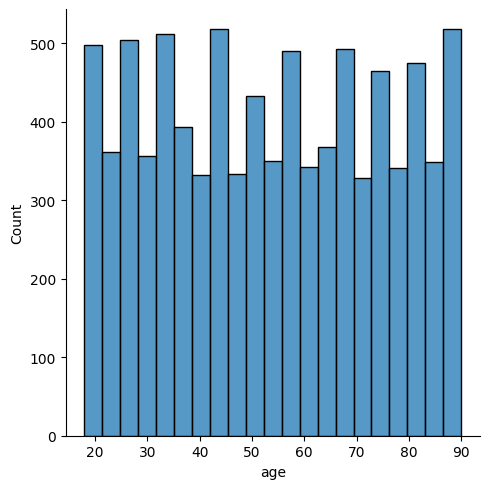

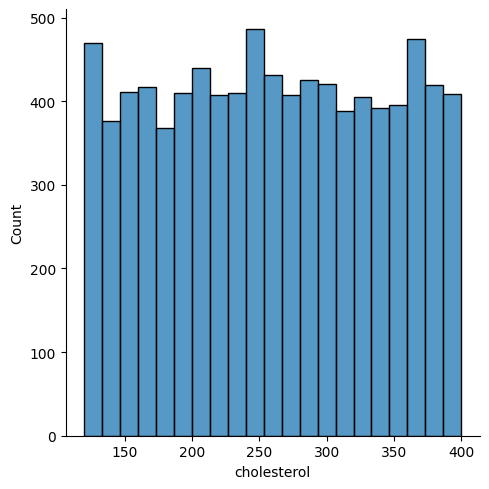

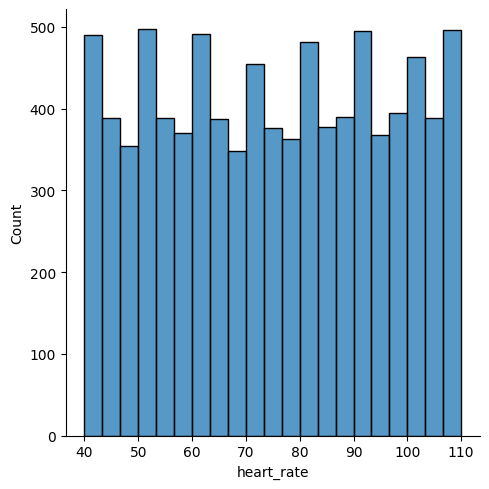

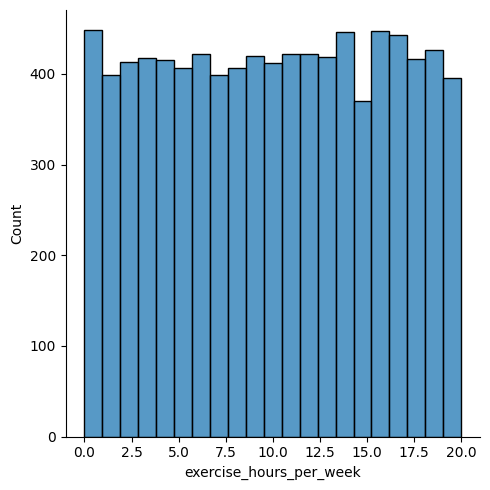

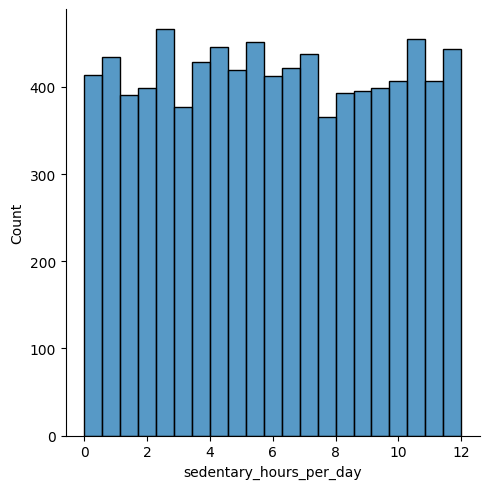

...

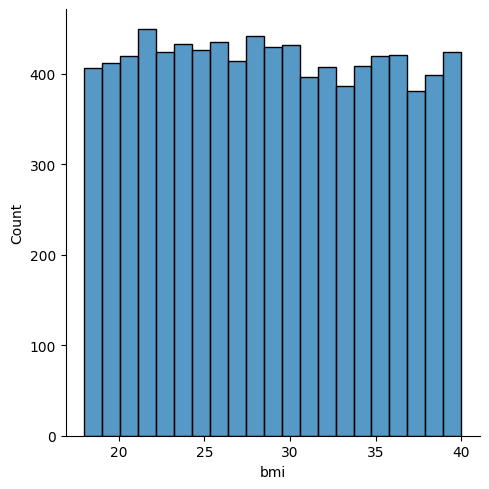

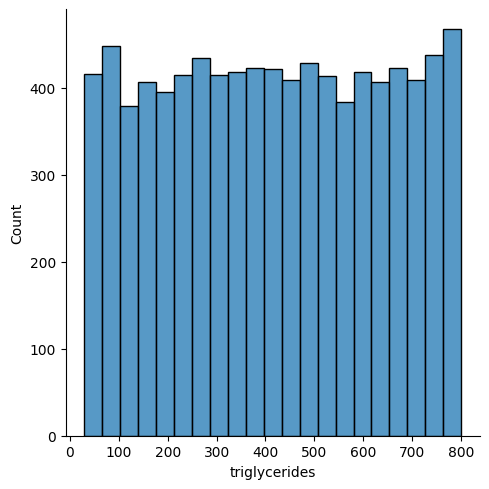

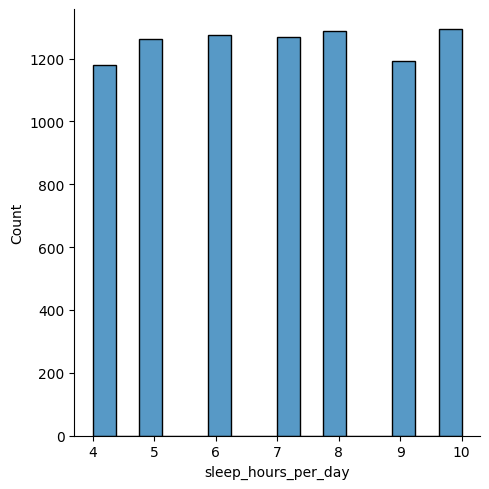

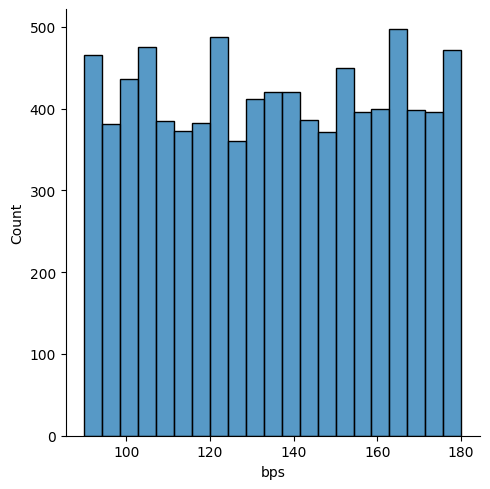

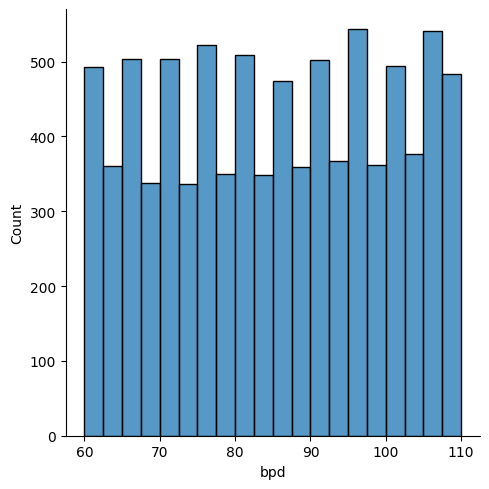

In [12]:
#graficar la ditribución de las variables numéricas
for i in df_raw.describe().columns:
  sns.displot(data=df_raw, x=i)


contrario a lo que pensaba en el desbribe todas las distribuciones son más o menos uniformes

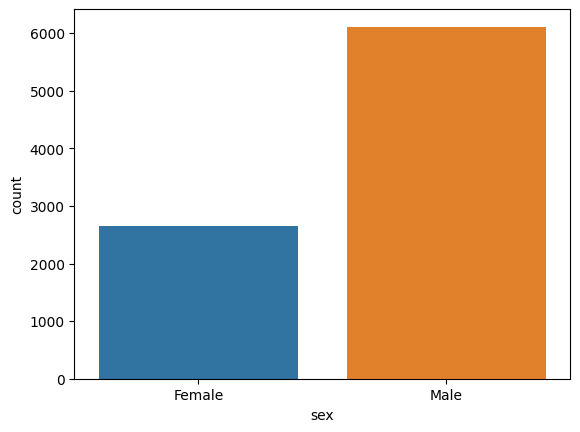

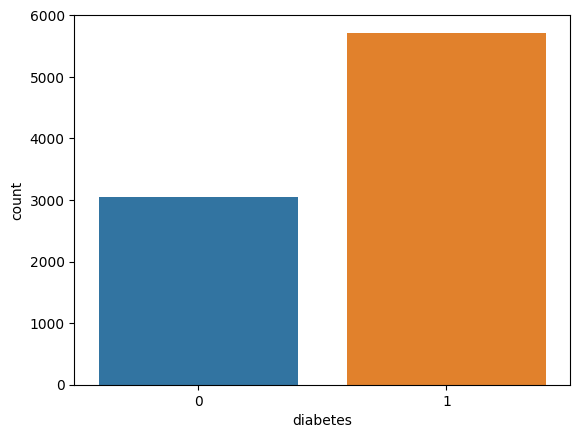

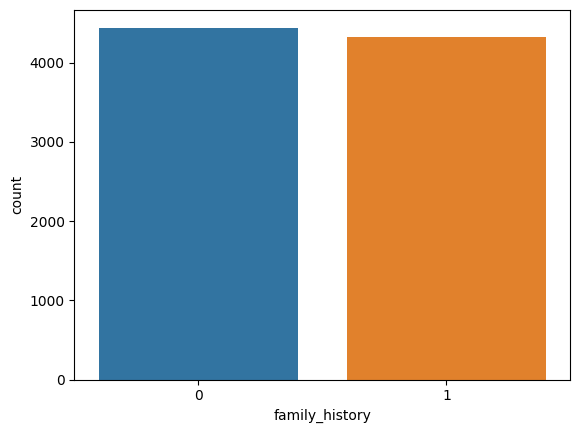

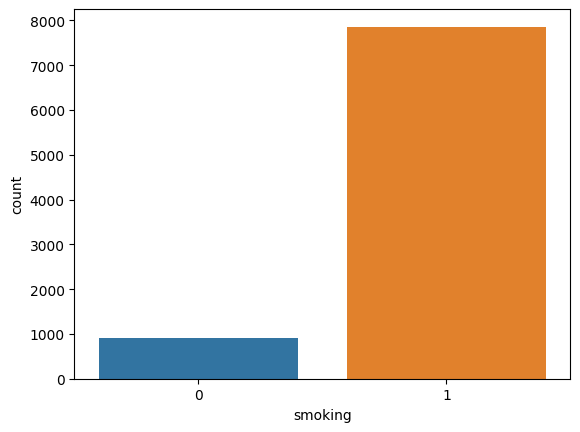

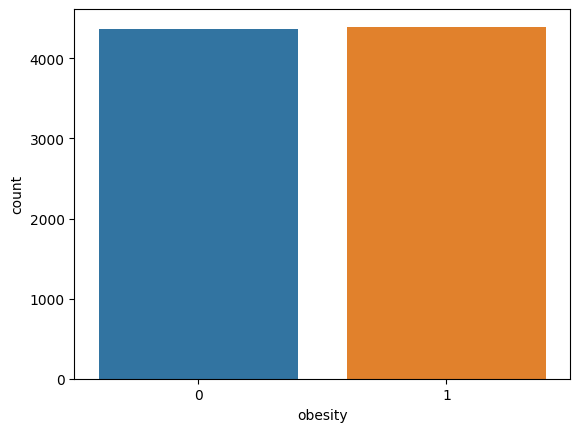

...

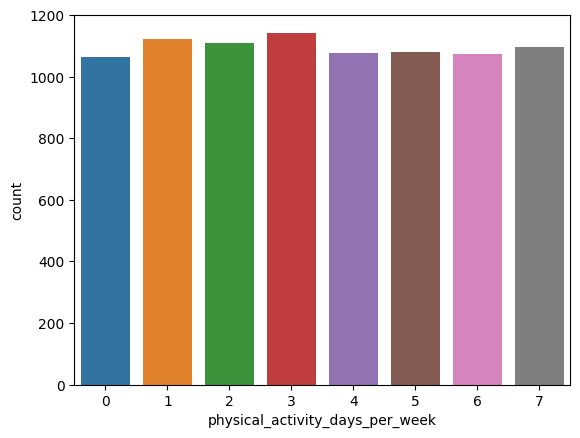

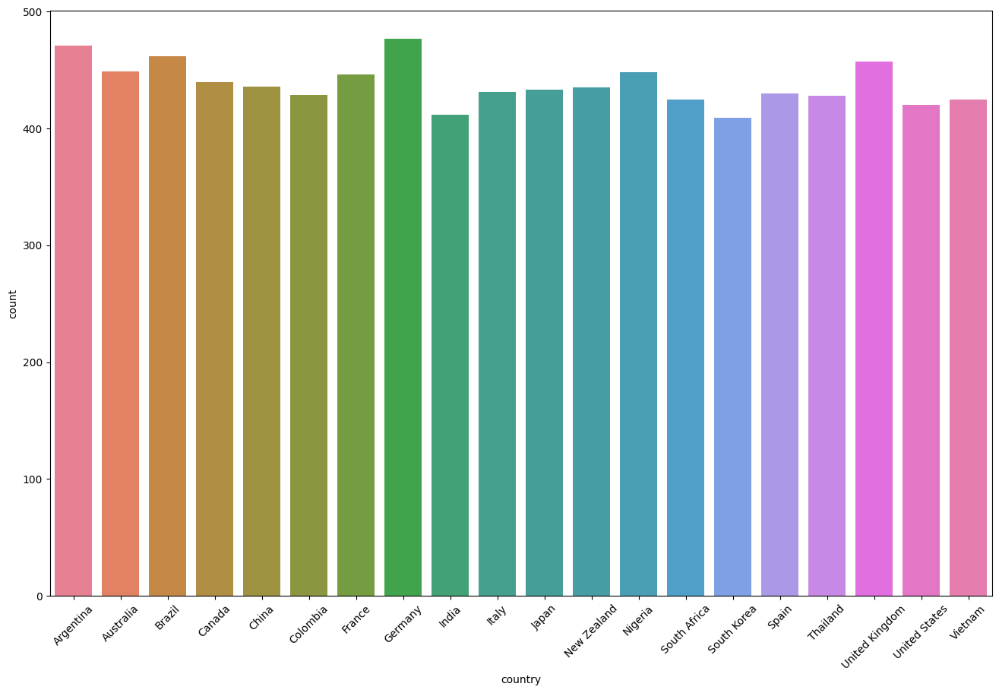

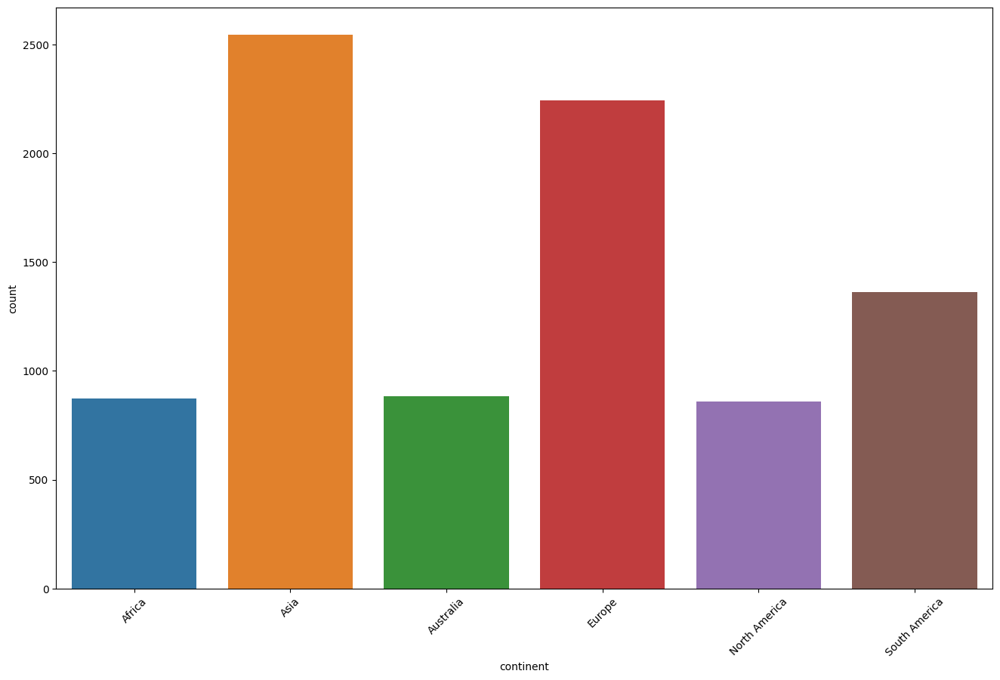

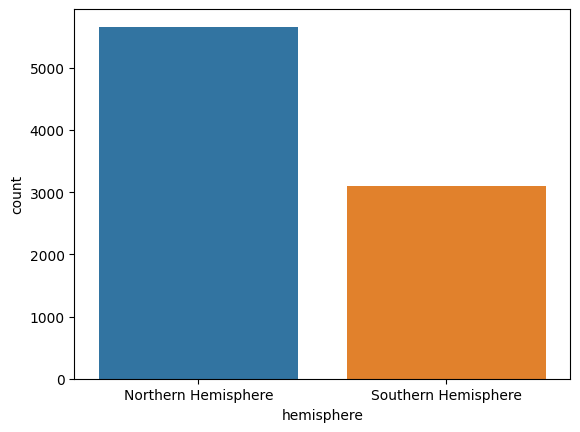

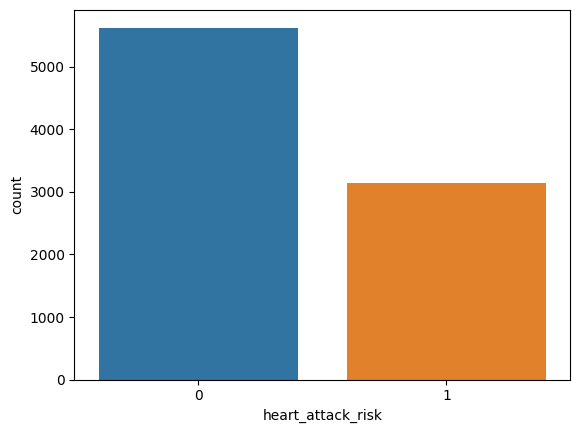

In [13]:
#barplot de variables categóricas
for i in df_raw.describe(include='category').columns:
  if i in ['country','continent']:
    plt.figure(figsize=(16,10))
    sns.countplot(data=df_raw, x=i ,hue=i,legend=False)
    plt.xticks(rotation=45)
    plt.show()
  else:
    sns.countplot(data=df_raw, x=i ,hue=i,legend=False)
    plt.show()

 En estos gráficos se observan que muchas variables estan balanceadas.

**Excepto**: sexo a predominio masc, diabetes a predomionio SI, fumar a predominio SI, consumo de alcohol a predomnio SI, los continentes precipalmente representados son ASIA y EUROPA

Si bien los países individualmente tienen aprox la misma cantidad de observaciones hay más países europeos y asíaticos

la mayoria de los pacientes no tuvo eventos coronarios

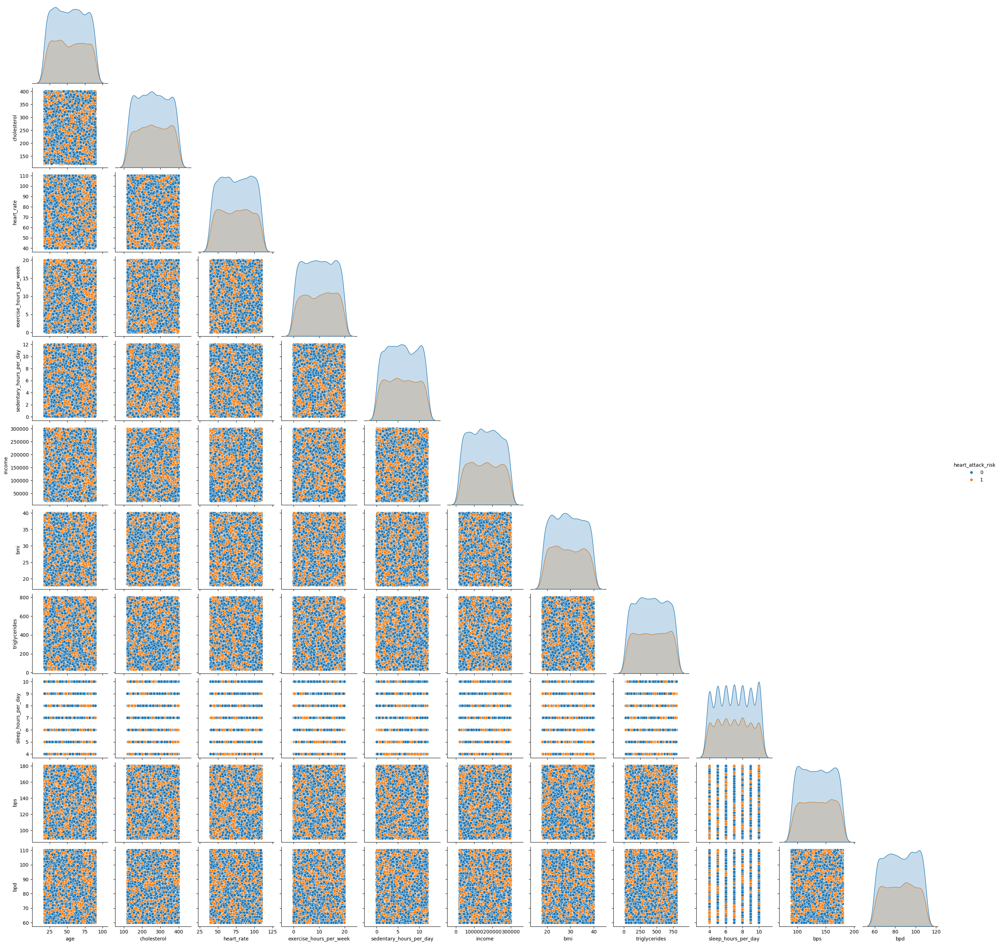

In [14]:
#distribucion de las variables cuantitativas
sns.pairplot(data=df_raw,hue='heart_attack_risk', corner=True)
plt.show()

Si bien este gráfrico tiene limitaciones visuales, ilustra la distribución uniforme de las variables cualitativas, lo que dificultará la implemetación de algoritmos como la regresión logística, svm, KNN.

## Análisis Bi y Tri variado


### Hipótesis 1: Relacionar los factores de riesgo cardiovacular con la cantidad de hs de ejercicio y sedentarismo

H0: Las hs de ejercicio y sedentarismo son las mismas en todas las categorías.

H1: las hs de ejercicio y sedentarismo son distintas en las categorías.

Debido a que en el análisis univariado se observó una distribució NO normal de Hs de ejercicio y sedentarismo se utilizarán test NO paramétricos.

Las variables dependientes son continuas excepto physical_activity_days_per_week, que es categórica.

* Las independientes categóricas con las dependientes numéricas se testearán con Wilcoxon rank sum test.
* Las independientes categóricas con las dependientes categóricas se testearán co Chi cuadrado.
* Las independientes numéricas con las dependientes numéricas y categóricas se testearán con Spearman.



In [15]:
# Creo una lista de las columnas que son factores de riesgo cardiovascular y las variables de interes
frcv_cat=['sex','diabetes','family_history','smoking','obesity','diet','previous_heart_problems','stress_level']
frcv_con=['age','cholesterol','bmi','triglycerides']
target=['exercise_hours_per_week','sedentary_hours_per_day','physical_activity_days_per_week']

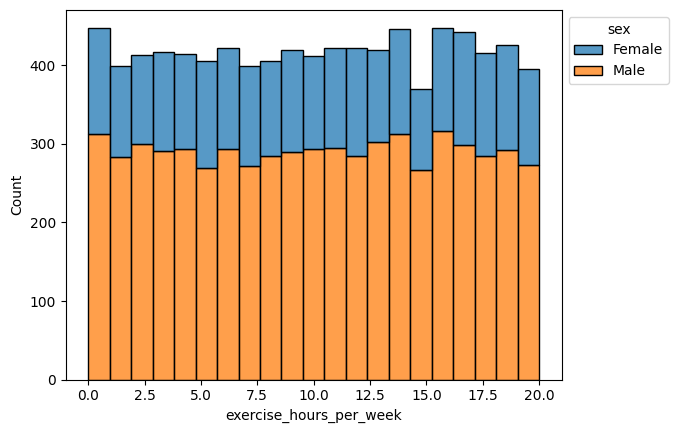

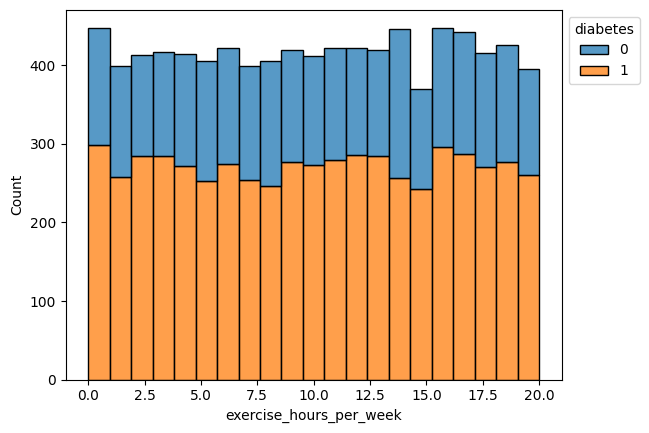

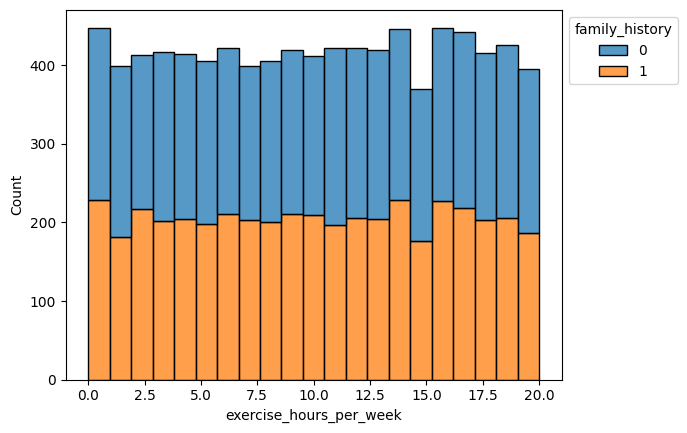

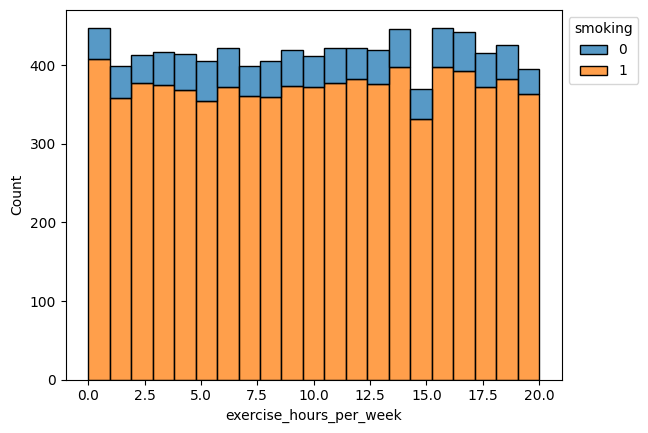

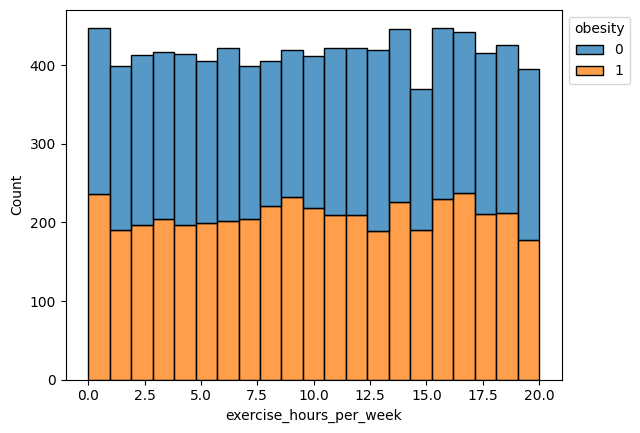

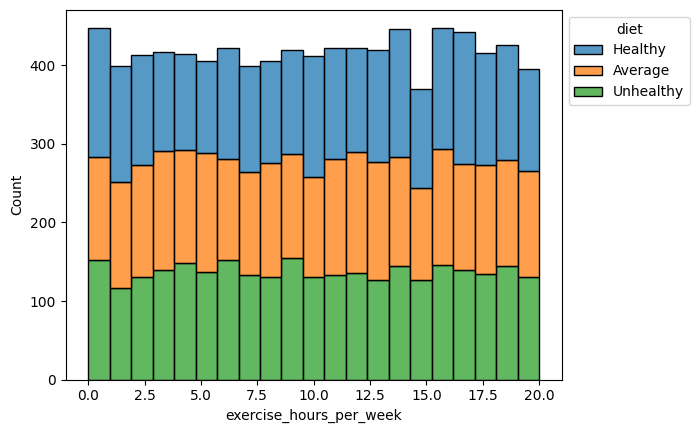

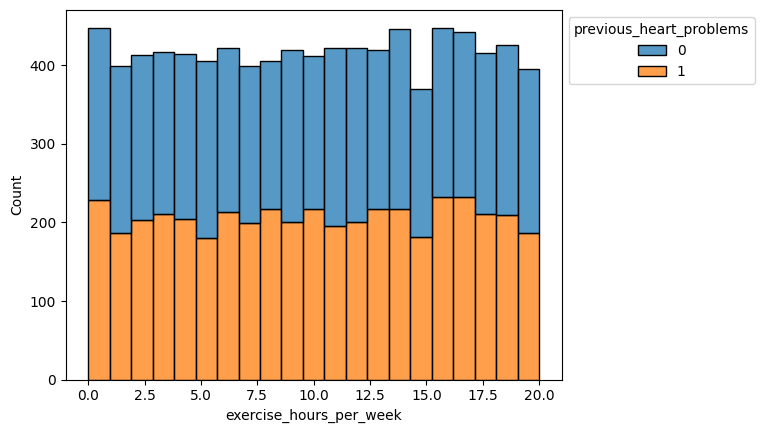

In [16]:
# excercise hours per week a lo largo de las variables de interés

for f in frcv_cat[:-1]:
  ax=sns.histplot(data=df_raw,x=target[0], hue=f,multiple='stack')
  sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
  plt.show()


vemos distribucion uniforme de las hs de ejercicio en los sexos. Habiendo mayor cantidad de observaciones de los hombres

vemos distribucion uniforme de las hs de ejercicio en diabetes. Siendo mayor la cantidad de pacientes diabaticos dentro del df

vemos distribucion uniforme de las hs de ejercicio en antecedentes familiares. Habiendo una cantidad similar de observaciones

vemos distribucion uniforme de las hs de ejercicio en estatus de fumador. Siendo la mayoría fumadores

vemos distribucion uniforme de las hs de ejercicio en estatus de obeso. Siendo la cantidad de obesos similar en el df

vemos distribucion uniforme de las hs de ejercicio de acuerdo al tipo de dieta. la cantidad de obesrvaciones por categoria es más o menos similar

vemos distribucion uniforme de las hs de ejercicio de acuerdo al a la presencia previa de previuos heart problems. la cantidad de obesrvaciones por categoria es m'as o menos similar

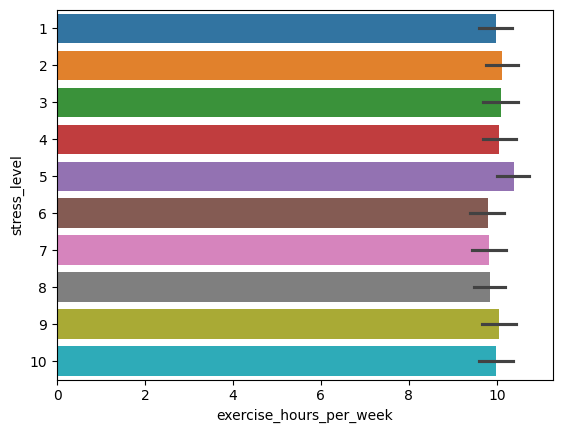

In [17]:
#Hs de ejercicio a lo largo de los niveles de stress
sns.barplot(data=df_raw,x=target[0], y=frcv_cat[-1],hue=frcv_cat[-1],legend=False)
plt.show()


vemos distribucion uniforme de las hs de ejercicio a lo largo de los niveles de stress.

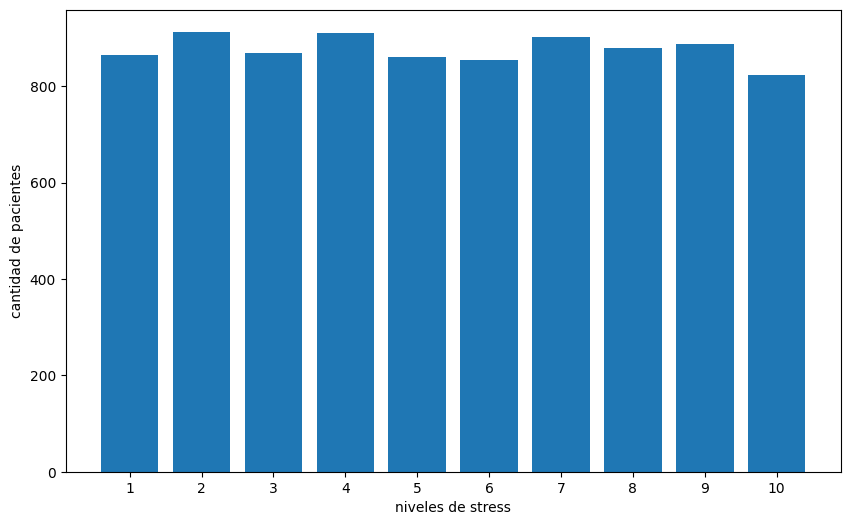

In [18]:
#Contar la cantidad de osbservaciones por nivel de stress
fig,ax=plt.subplots(figsize=(10,6))
ax.bar(x=df_raw[frcv_cat[-1]].value_counts().index,height=df_raw[frcv_cat[-1]].value_counts().values)
ax.set_xticks(range(1,11))
ax.set_xlabel('niveles de stress')
ax.set_ylabel('cantidad de pacientes')
plt.show()

La cantidad de observaciones se similar a lo largo de los niveles de stress.

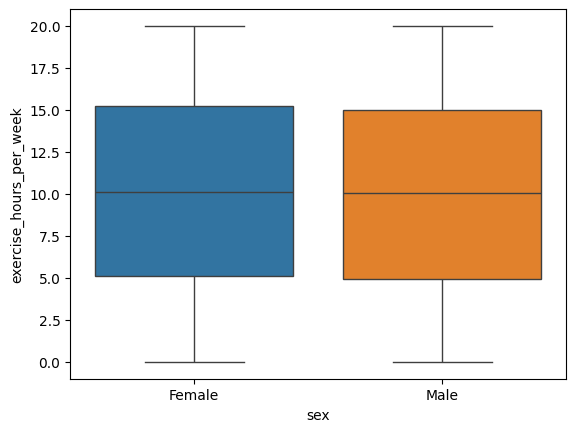

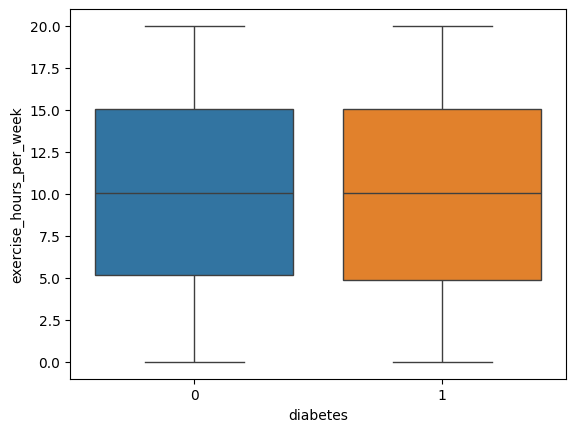

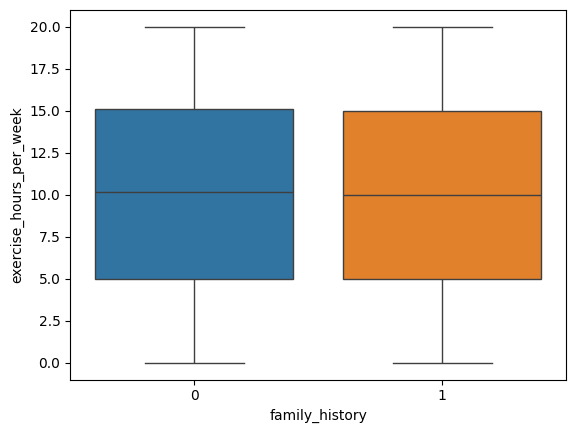

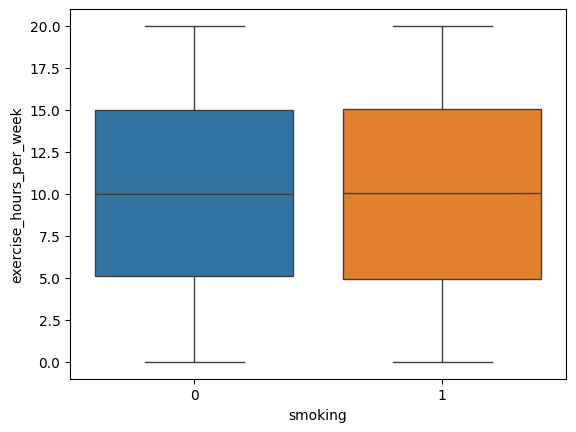

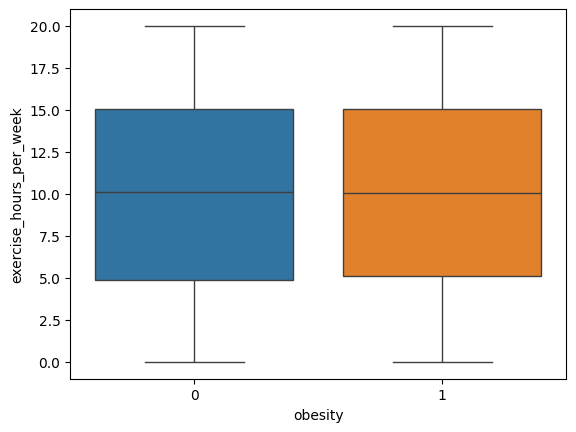

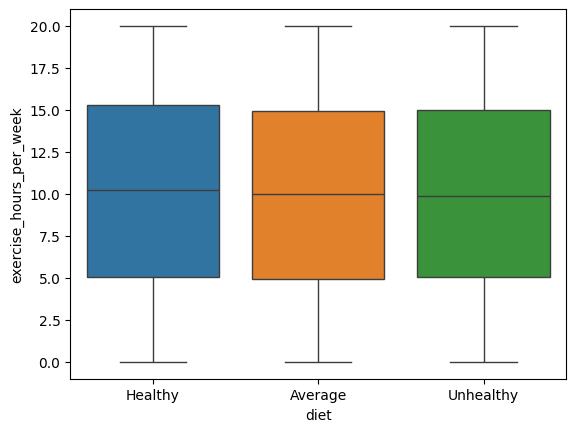

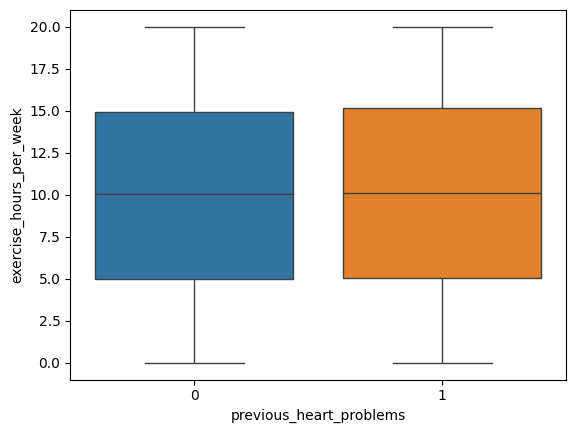

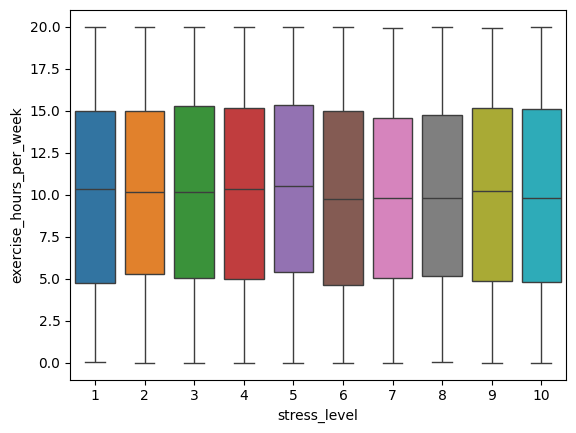

In [19]:
#cuantificar hs de ejercicio a lo largo de las categorías de interes
for f in frcv_cat:
  sns.boxplot(data=df_raw,y=target[0],x=f,hue=f,legend=False)
  plt.show()


 Como conclusión podemos decir  la cantidad de ejercicio medida en hs por semana demuestra una distribución homogénea en esta base sintética, no habiendo  diferencias estadísticamente significativas entre los FRCV. Los FRCV se ecuentran equilibrados entre las categorías excepto sexo masculino, diabetes y fumador.

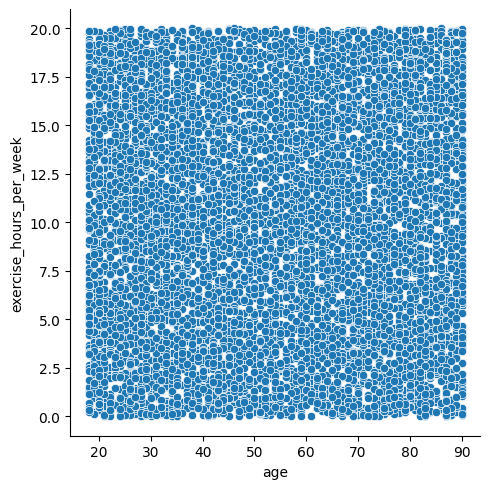

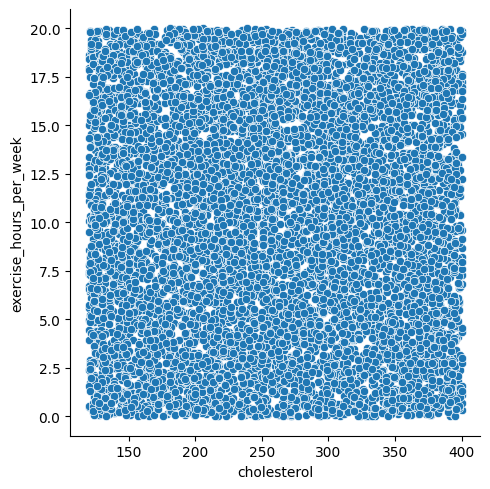

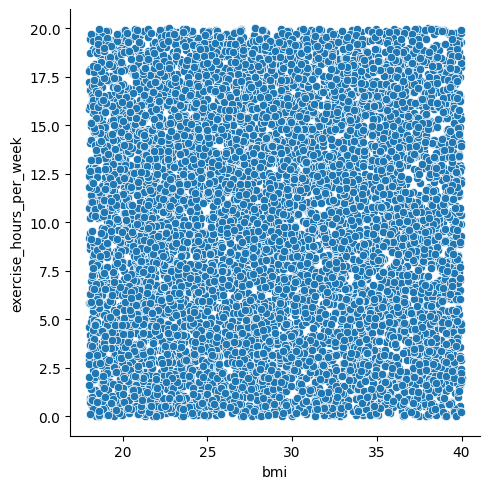

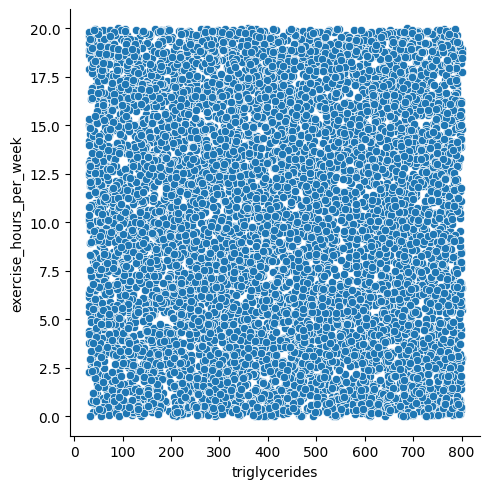

In [20]:
#variables cuantitativas.
for f in frcv_con:
  sns.relplot(data=df_raw,x=f,y=target[0])
  plt.show()

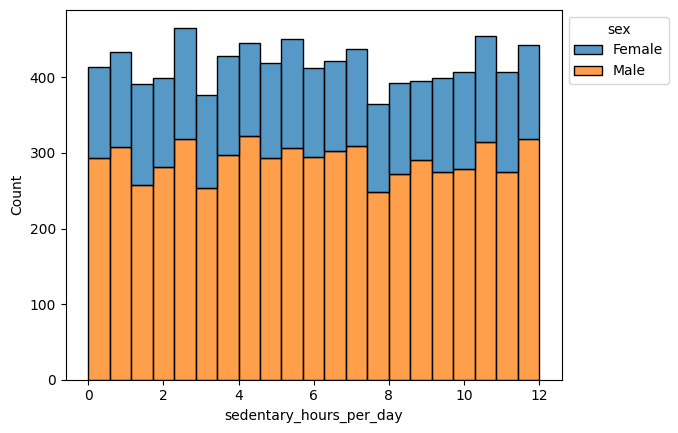

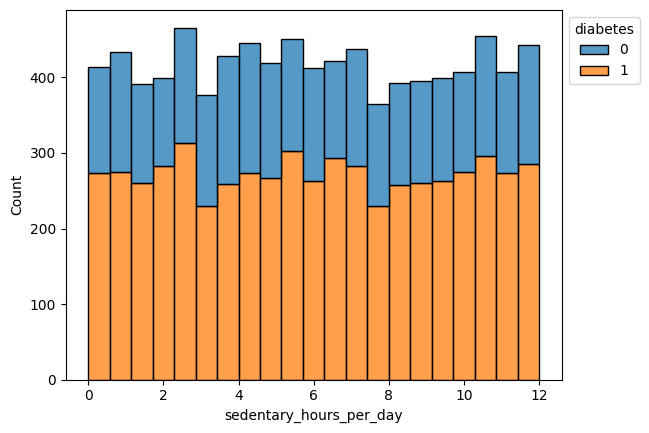

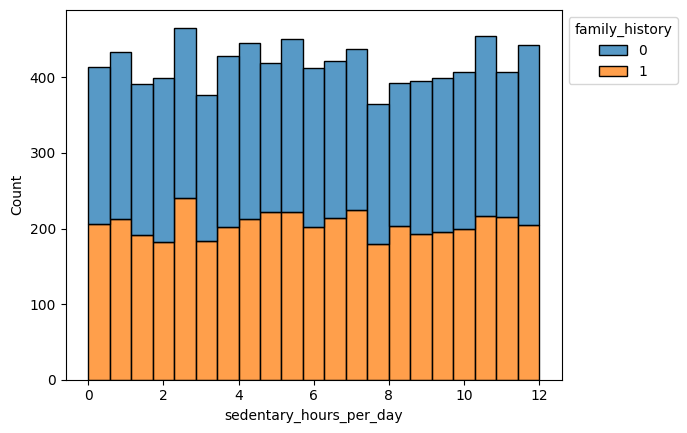

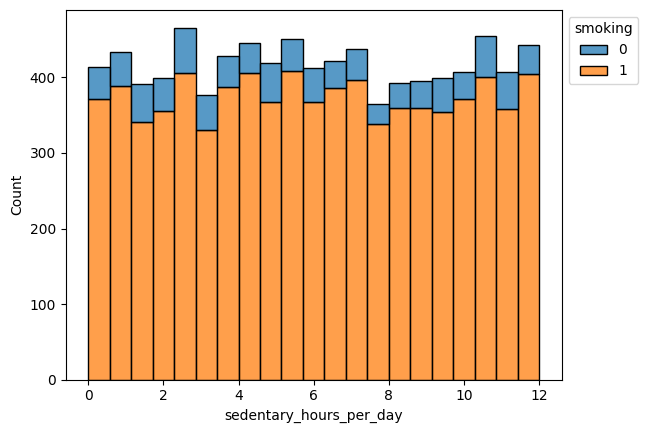

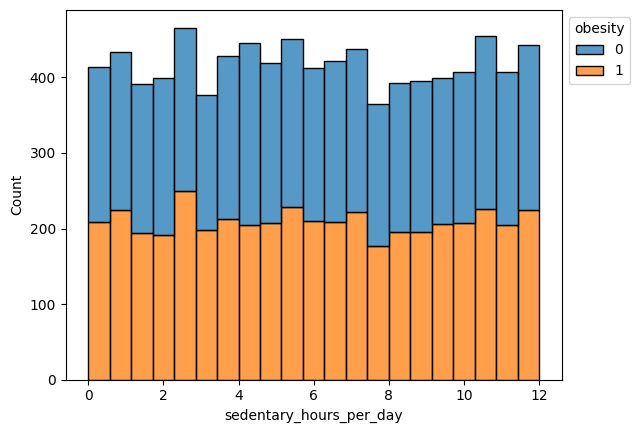

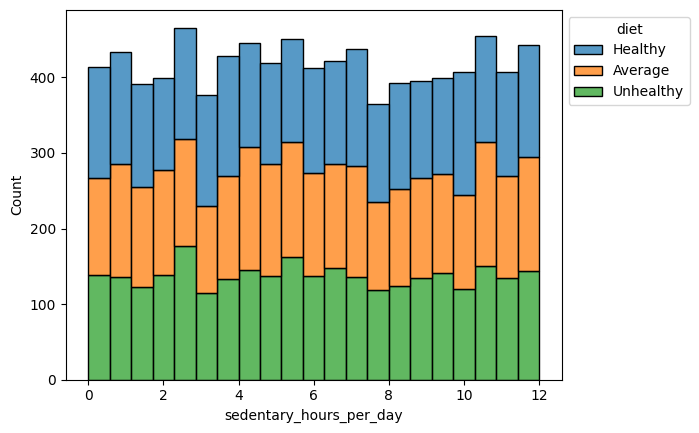

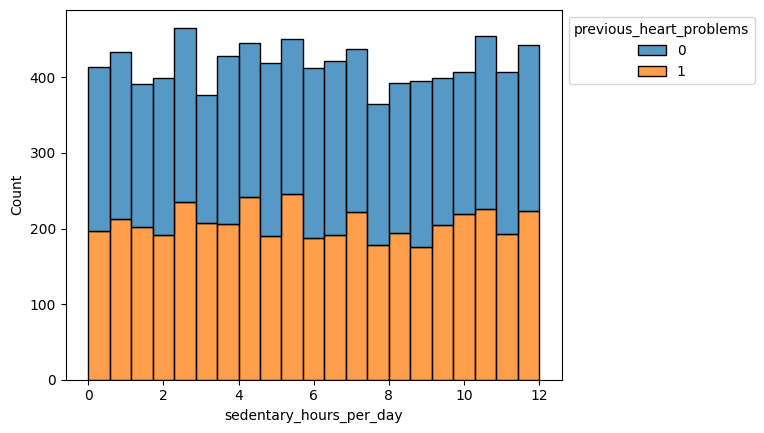

In [21]:
#Cantidad de obesrvaciones a lo largo de las categorias
for f in frcv_cat[:-1]:
  ax=sns.histplot(data=df_raw,x=target[1], hue=f,multiple='stack')
  sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
  plt.show()

<Axes: xlabel='sedentary_hours_per_day', ylabel='stress_level'>

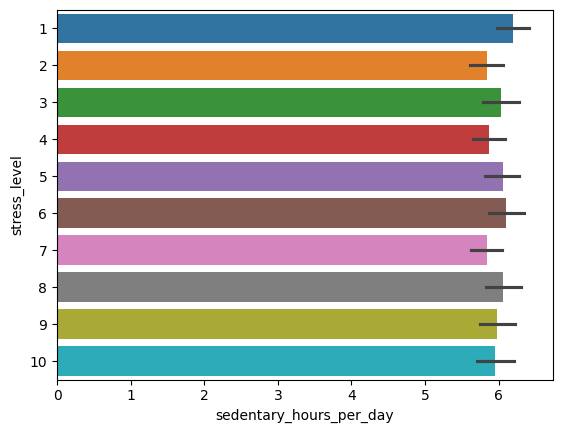

In [22]:
#promedio de hs sedentarios por dia de acuerdo a los niveles de stress
sns.barplot(data=df_raw,x=target[1], y=frcv_cat[-1],hue=frcv_cat[-1],legend=False)

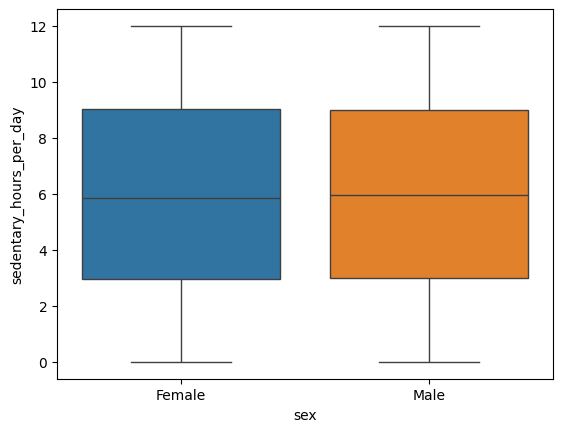

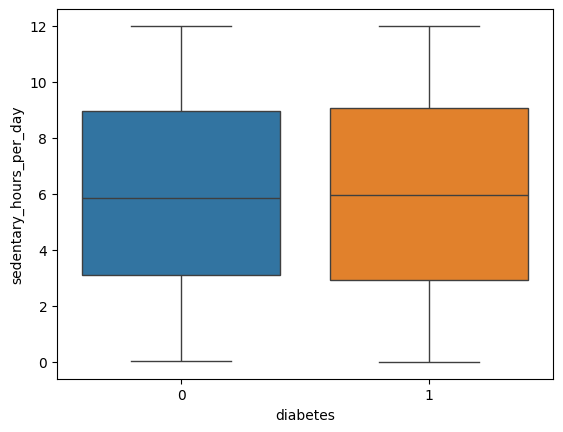

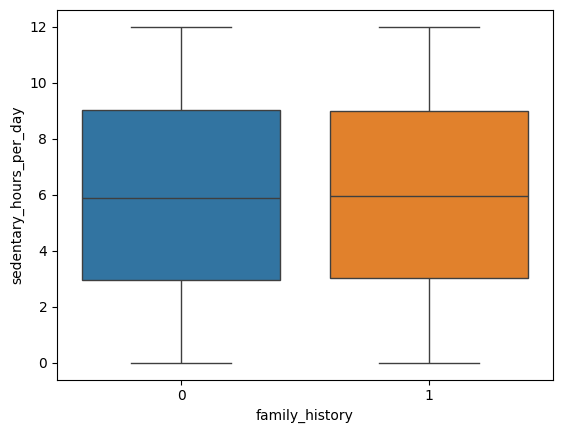

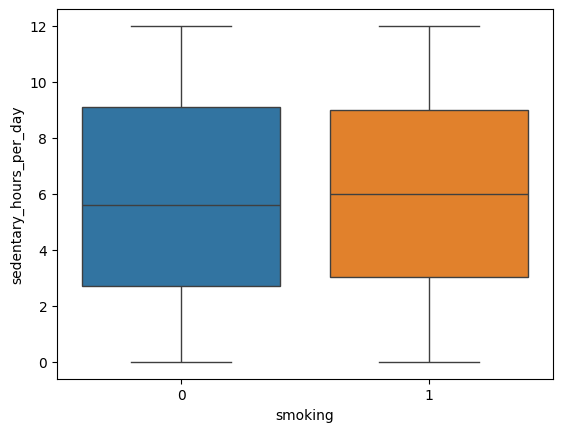

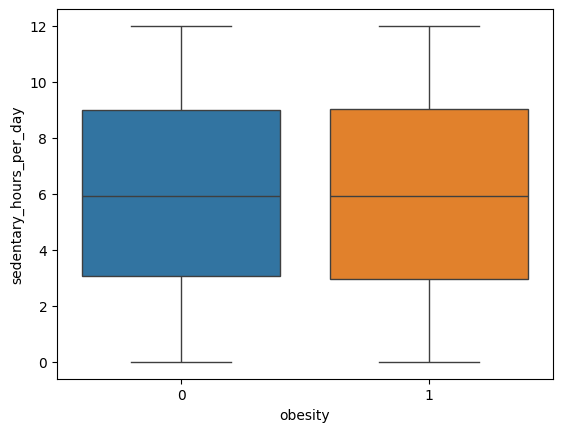

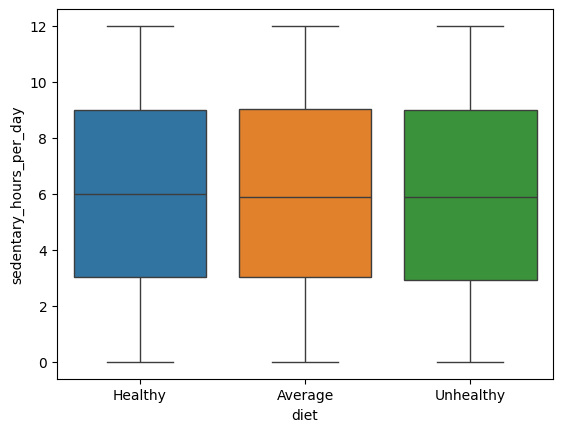

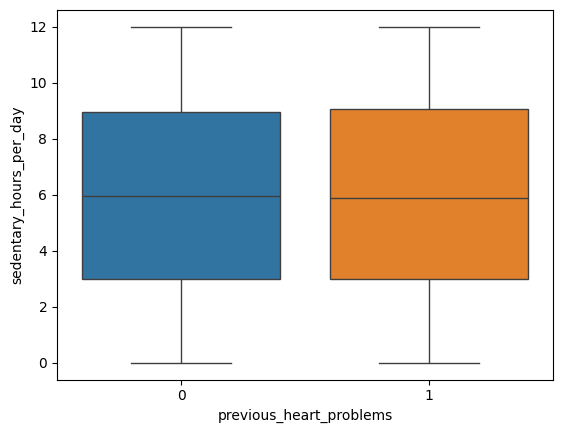

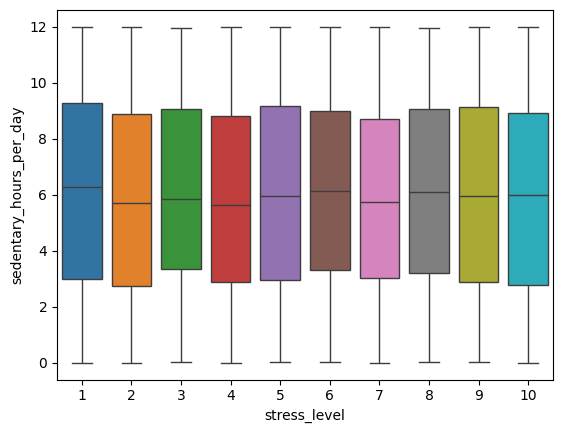

In [23]:
#hs sedentarias por categoría
for f in frcv_cat:
  sns.boxplot(data=df_raw,y=target[1],x=f,hue=f,legend=False)
  plt.show()

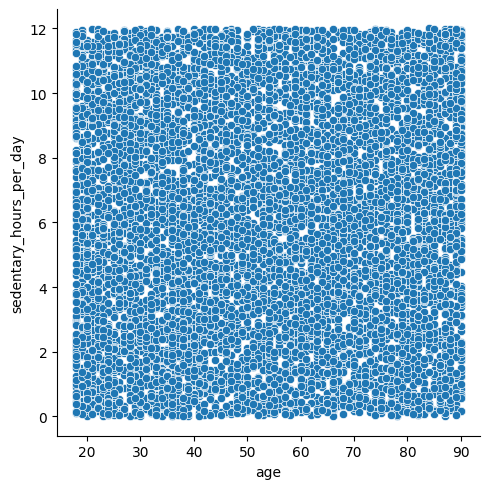

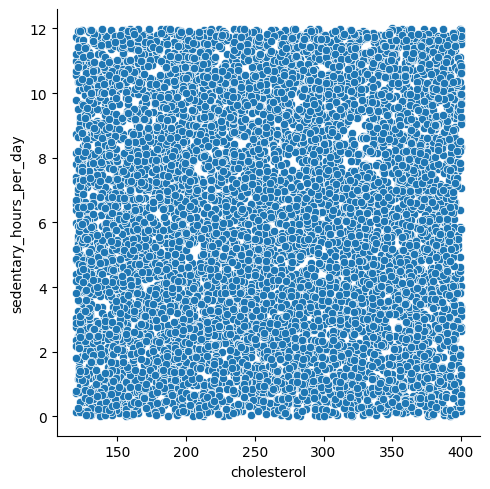

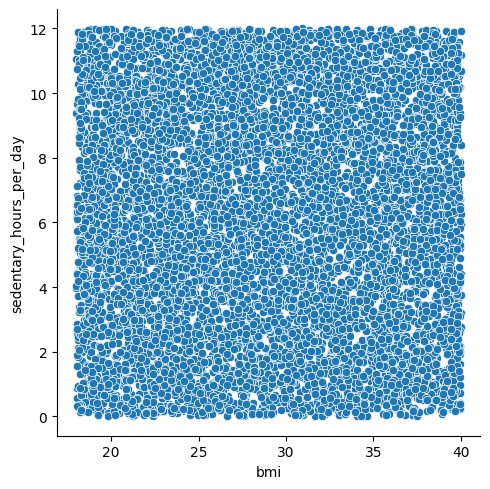

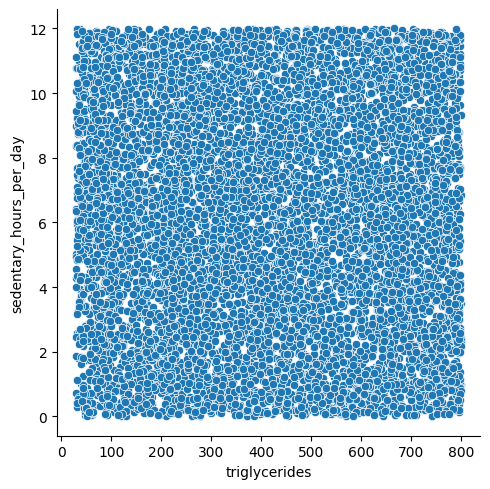

In [24]:
#scatter plot de variables cuantitativas
for f in frcv_con:
  sns.relplot(data=df_raw,x=f,y=target[1])
  plt.show()

distribuciones homogeneas sin tendencias

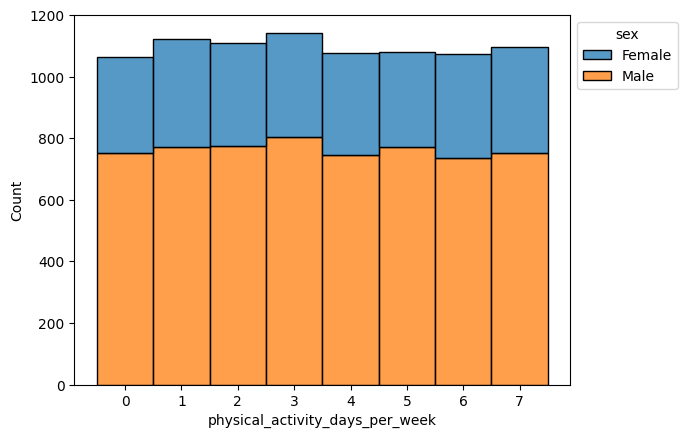

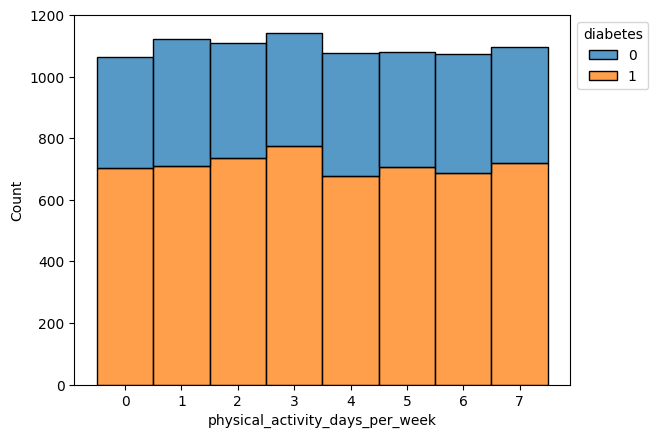

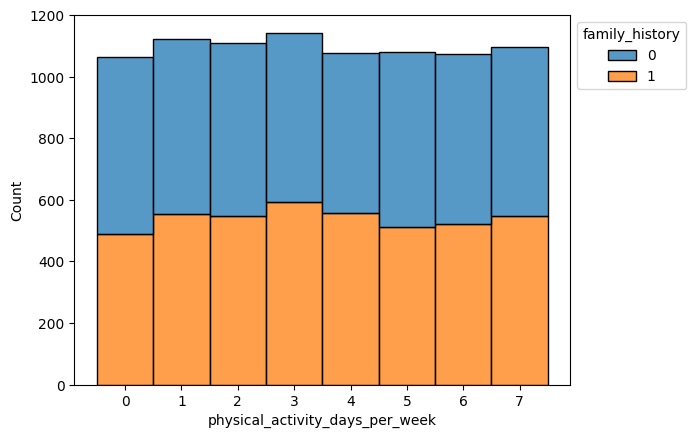

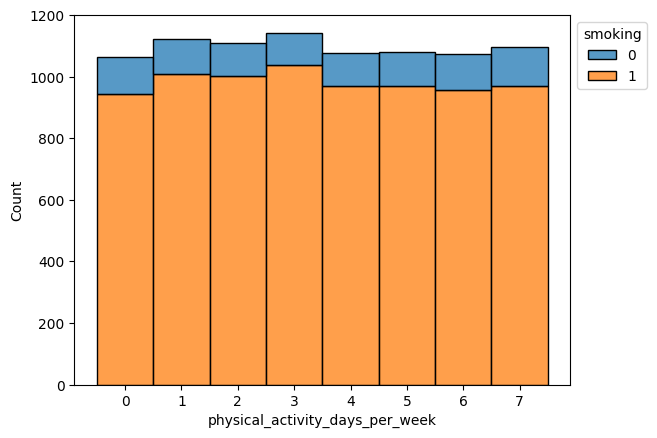

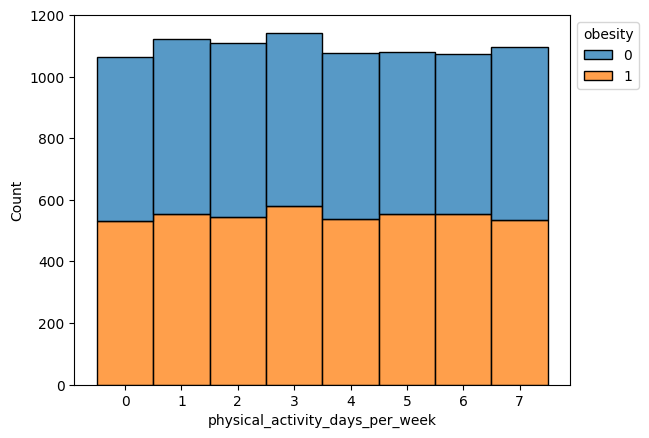

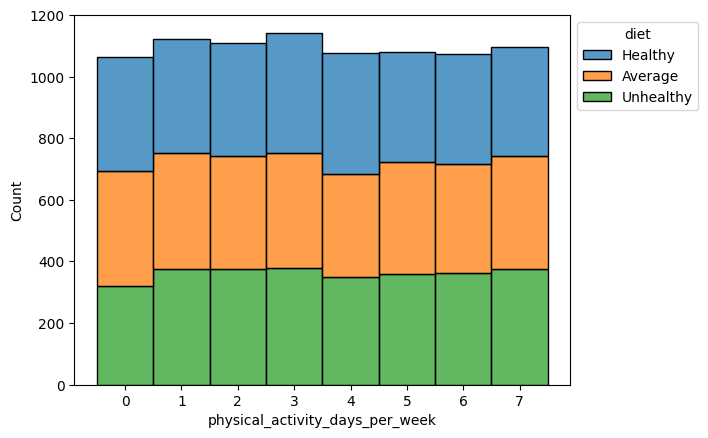

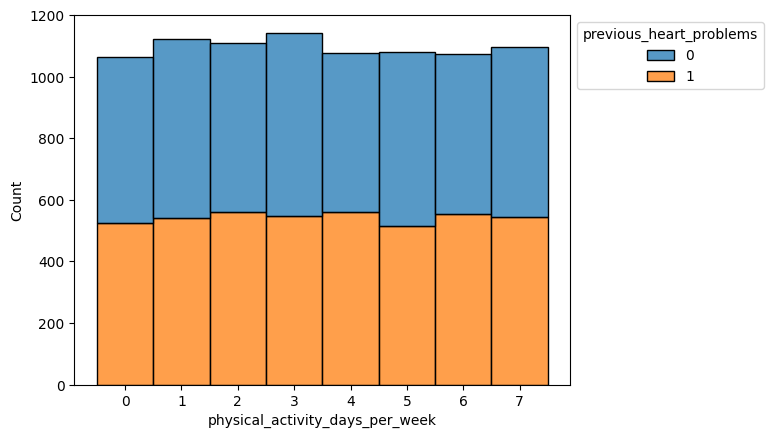

In [25]:
#dias de actividad física a lo largo de las categorías
for f in frcv_cat[:-1]:
  ax=sns.histplot(data=df_raw,x=target[2], hue=f,multiple='stack')
  sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
  plt.show()

<Axes: xlabel='stress_level', ylabel='physical_activity_days_per_week'>

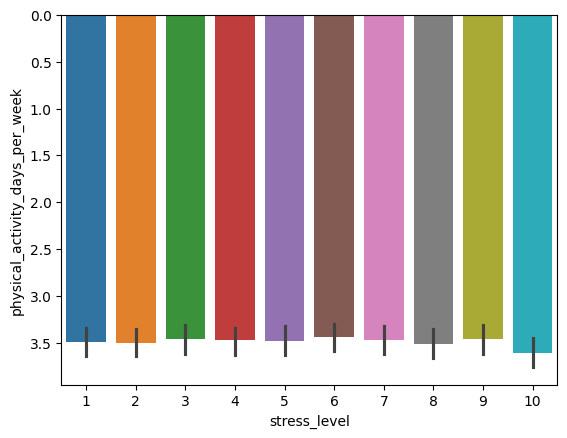

In [26]:
#dias sedentarios a lo largo de las categorías
sns.barplot(data=df_raw,y=target[2], x=frcv_cat[-1],hue=frcv_cat[-1],legend=False)

todos los niveles de stress tienen mas o menos la misma cantidad de hs sedentarias

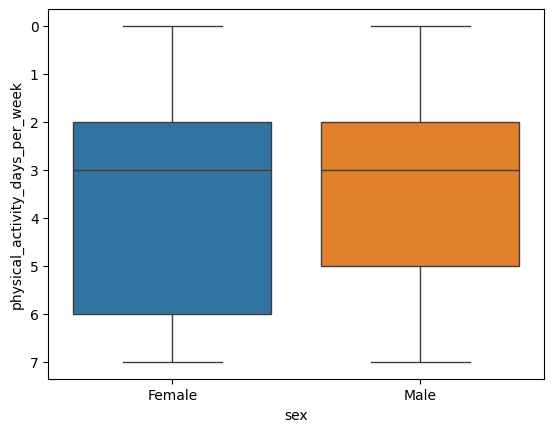

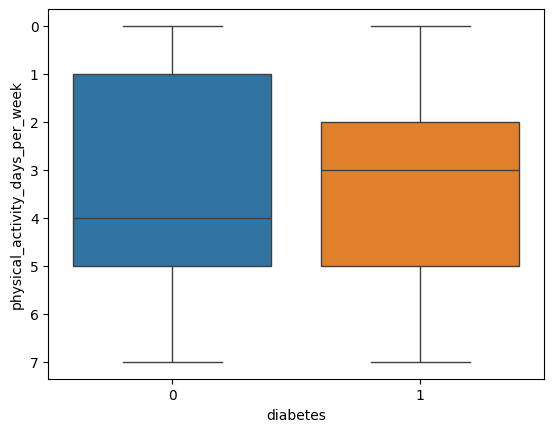

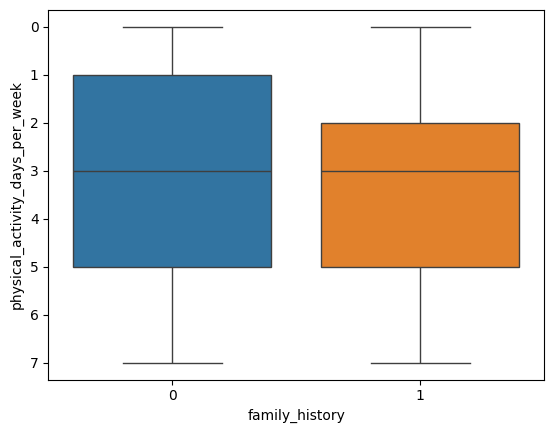

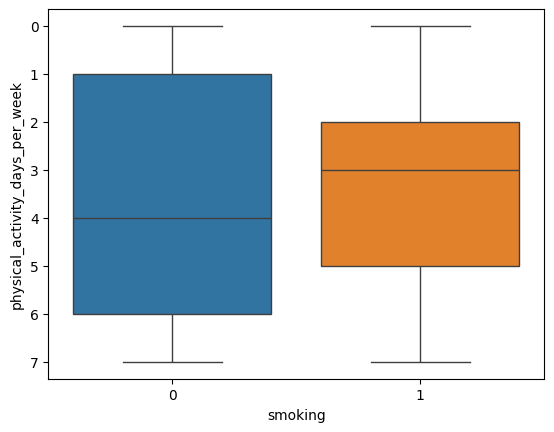

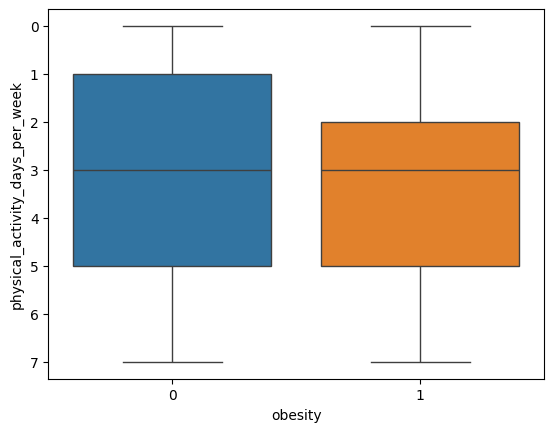

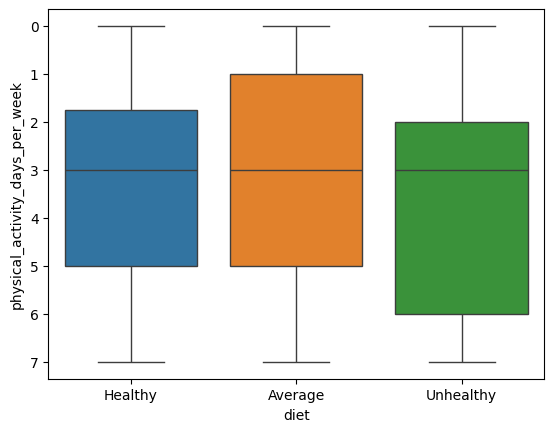

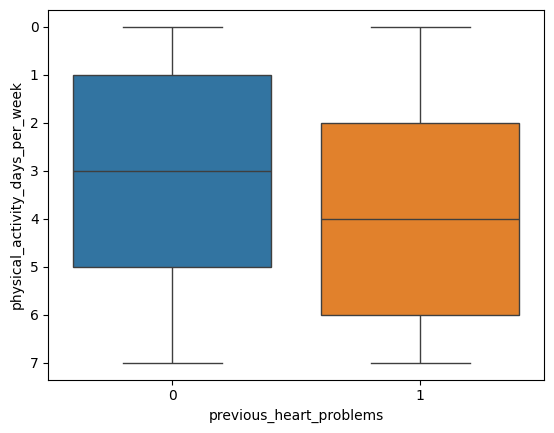

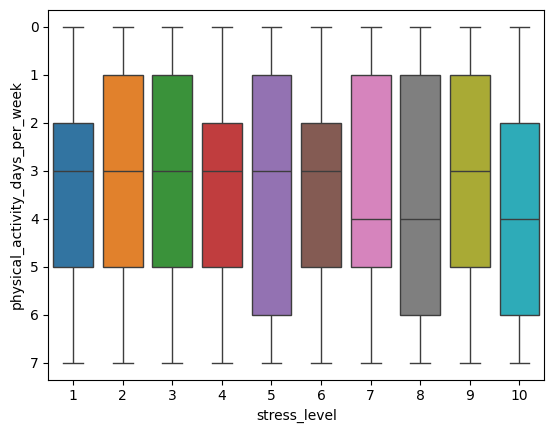

In [27]:
#dias de actividad física a lo largo de las categorías de interés
for f in frcv_cat:
  sns.boxplot(data=df_raw,y=target[2],x=f,hue=f,legend=False)
  plt.show()

pareceria haber una diferencia en la media de los dias de actividad física en diabéticos, en fumadores (siendo mayor) y menor en pacientes con problemas cardiacos previos y nlos niveles 7-8-10 de stress

In [28]:
# test hipotesis mediana de sedentary_hours_per_day por categoria de FRCV
for i in frcv_cat:
  group1=df_raw[df_raw[i]==df_raw[i].unique()[0]]['sedentary_hours_per_day']
  group2=df_raw[df_raw[i]==df_raw[i].unique()[1]]['sedentary_hours_per_day']
  statistic, p_value = ranksums(group1, group2)
  print(f"Wilcoxon test for {i}: statistic={statistic:.2f}, p-value={p_value:.3f}")

Wilcoxon test for sex: statistic=0.28, p-value=0.777
Wilcoxon test for diabetes: statistic=-0.43, p-value=0.665
Wilcoxon test for family_history: statistic=-0.25, p-value=0.802
Wilcoxon test for smoking: statistic=1.44, p-value=0.149
Wilcoxon test for obesity: statistic=0.13, p-value=0.898
Wilcoxon test for diet: statistic=0.34, p-value=0.735
Wilcoxon test for previous_heart_problems: statistic=0.27, p-value=0.787
Wilcoxon test for stress_level: statistic=-1.28, p-value=0.201


In [29]:
# Test hipotesis nula para horas de ejercicios
for i in frcv_cat:
  group1=df_raw[df_raw[i]==df_raw[i].unique()[0]]['exercise_hours_per_week']
  group2=df_raw[df_raw[i]==df_raw[i].unique()[1]]['exercise_hours_per_week']
  statistic, p_value = ranksums(group1, group2)
  print(f"Wilcoxon test for {i}: statistic={statistic:.2f}, p-value={p_value:.3f}")


Wilcoxon test for sex: statistic=-0.66, p-value=0.510
Wilcoxon test for diabetes: statistic=0.66, p-value=0.510
Wilcoxon test for family_history: statistic=0.60, p-value=0.548
Wilcoxon test for smoking: statistic=-0.01, p-value=0.994
Wilcoxon test for obesity: statistic=-0.19, p-value=0.849
Wilcoxon test for diet: statistic=-0.25, p-value=0.800
Wilcoxon test for previous_heart_problems: statistic=-0.49, p-value=0.627
Wilcoxon test for stress_level: statistic=0.29, p-value=0.769


In [30]:
# prompt: use spearman test with df_raw[frcv_con] to test null hypothesis with df[target]

for i in frcv_con:
  for j in target:
    statistic, p_value = spearmanr(df_raw[i], df_raw[j])
    print(f"Spearman test for {i} and {j}: statistic={statistic:.2f}, p-value={p_value:.3f}")


Spearman test for age and exercise_hours_per_week: statistic=0.00, p-value=0.900
Spearman test for age and sedentary_hours_per_day: statistic=0.02, p-value=0.101
Spearman test for age and physical_activity_days_per_week: statistic=0.00, p-value=0.890
Spearman test for cholesterol and exercise_hours_per_week: statistic=0.02, p-value=0.046
Spearman test for cholesterol and sedentary_hours_per_day: statistic=0.02, p-value=0.078
Spearman test for cholesterol and physical_activity_days_per_week: statistic=0.02, p-value=0.134
Spearman test for bmi and exercise_hours_per_week: statistic=0.00, p-value=0.720
Spearman test for bmi and sedentary_hours_per_day: statistic=0.00, p-value=0.983
Spearman test for bmi and physical_activity_days_per_week: statistic=0.01, p-value=0.452
Spearman test for triglycerides and exercise_hours_per_week: statistic=0.00, p-value=0.866
Spearman test for triglycerides and sedentary_hours_per_day: statistic=-0.01, p-value=0.592
Spearman test for triglycerides and phys

Hay una asociación estadísticamente significativa entre colesterol y horas de ejericicio semanal. Sin embargo, su magnitud es ínfima con 0.02. Esto podría ser una hallazgo casual.

In [31]:
# Perform chi-square tests and store results
p_values = []
for feature in frcv_cat:
  contingency_table = pd.crosstab(df_raw[feature], df_raw['physical_activity_days_per_week'])
  chi2, p, dof, expected = chi2_contingency(contingency_table)
  p_values.append(p)
  print(f"Chi-square test for {feature} and physical_activity_days_per_week: p-value={p:.3f}")

# Bonferroni correction
reject, corrected_p_values, _, _ = multipletests(p_values, method='bonferroni')

# Print corrected p-values
for i, feature in enumerate(frcv_cat):
  print(f"Corrected p-value for {feature}: {corrected_p_values[i]:.3f}")


Chi-square test for sex and physical_activity_days_per_week: p-value=0.805
Chi-square test for diabetes and physical_activity_days_per_week: p-value=0.203
Chi-square test for family_history and physical_activity_days_per_week: p-value=0.083
Chi-square test for smoking and physical_activity_days_per_week: p-value=0.648
Chi-square test for obesity and physical_activity_days_per_week: p-value=0.877
Chi-square test for diet and physical_activity_days_per_week: p-value=0.697
Chi-square test for previous_heart_problems and physical_activity_days_per_week: p-value=0.251
Chi-square test for stress_level and physical_activity_days_per_week: p-value=0.298
Corrected p-value for sex: 1.000
Corrected p-value for diabetes: 1.000
Corrected p-value for family_history: 0.661
Corrected p-value for smoking: 1.000
Corrected p-value for obesity: 1.000
Corrected p-value for diet: 1.000
Corrected p-value for previous_heart_problems: 1.000
Corrected p-value for stress_level: 1.000


### Conclusión de la hipótesis 1: la cantidad de hs de ejercicio semanales tubo una infima correlación positiva con los niveles de colesterol. Esta parece ser solamente una asociación estdística y no clínicamente relevante. El resto de los factores de riesgo no influyó en las variables de interés.

### Hipótesis 2: Relacionar los niveles de tensión arterial sistólica y diastólica con los niveles de Stress

H0: Los niveles de tensión arterial tanto sistólica y diastólica son iguales a lo largo de todas los niveles de stress

H1: Los niveles de tensión arterial tanto sistólica y diastólica son distintos a lo largo de todas los niveles de stress

Para comprobar esta hipótesis se utilizará el test de Kruskall wallis debido a la naturaleza no normal de las variables

<Axes: xlabel='stress_level', ylabel='bps'>

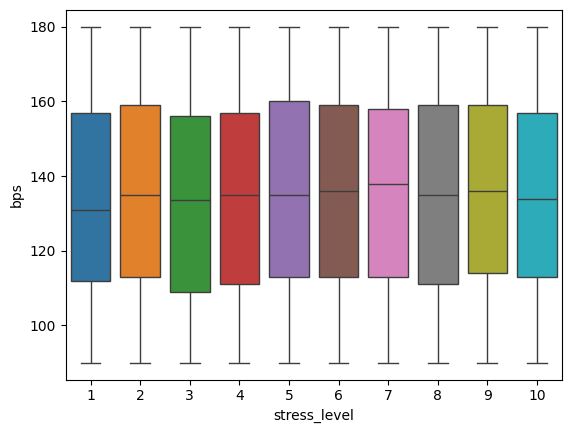

In [32]:
sns.boxplot(data=df_raw,y='bps',x='stress_level',hue='stress_level',legend=False)

<Axes: xlabel='stress_level', ylabel='bpd'>

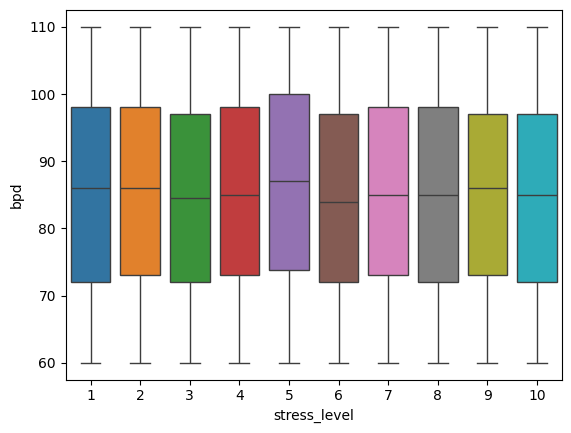

In [33]:
sns.boxplot(data=df_raw,y='bpd',x='stress_level',hue='stress_level',legend=False)

la presión diastólica y sistólica no parece variar significativamente a lo largo de los niveles de stress

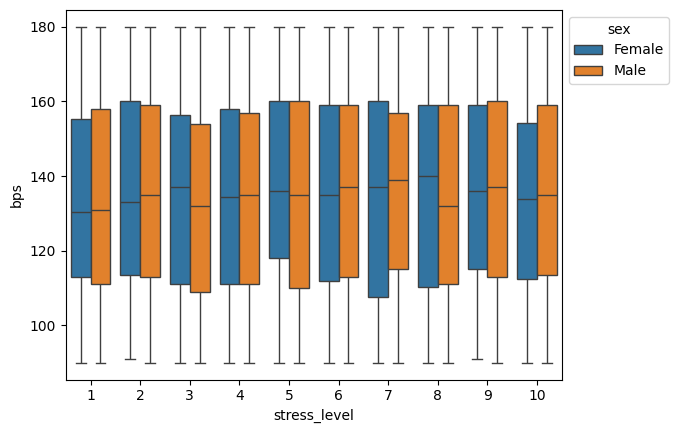

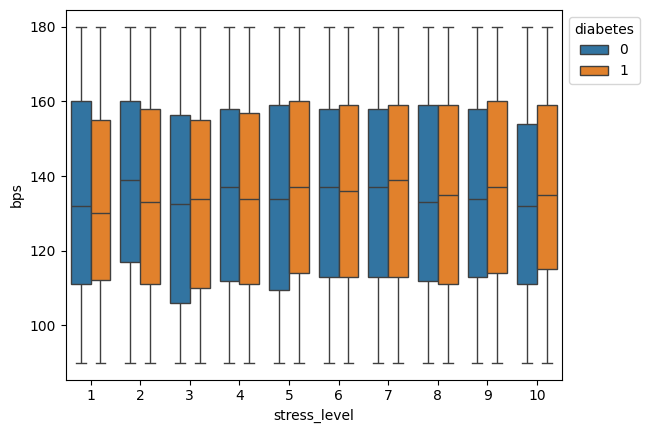

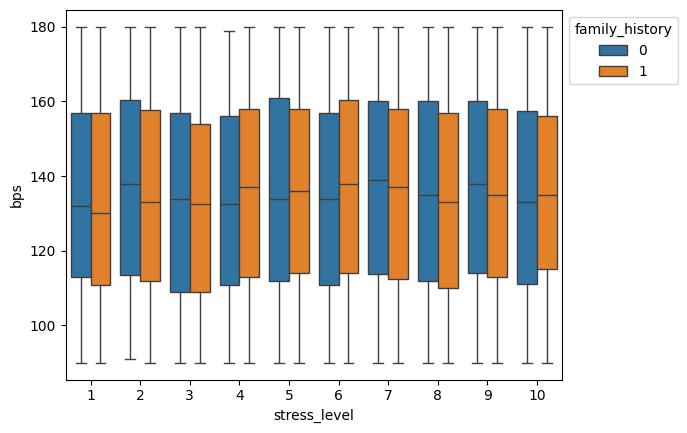

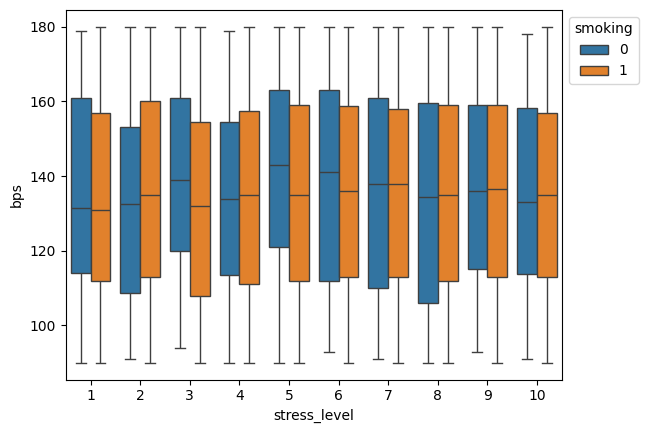

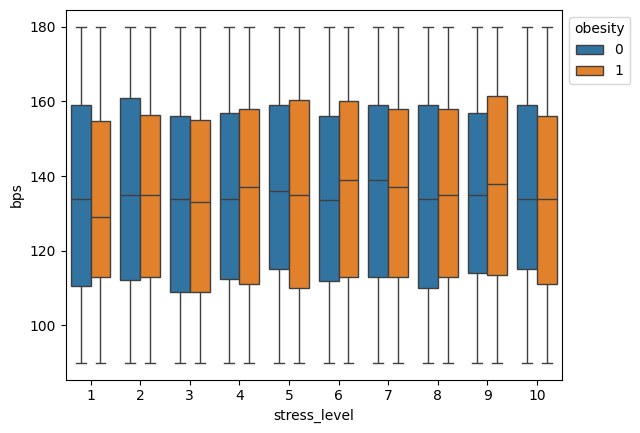

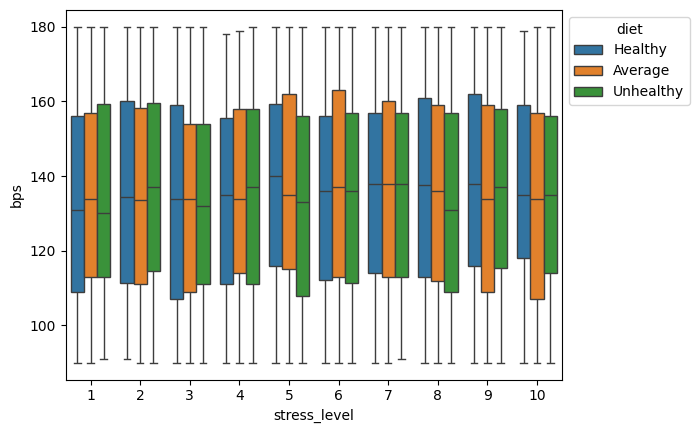

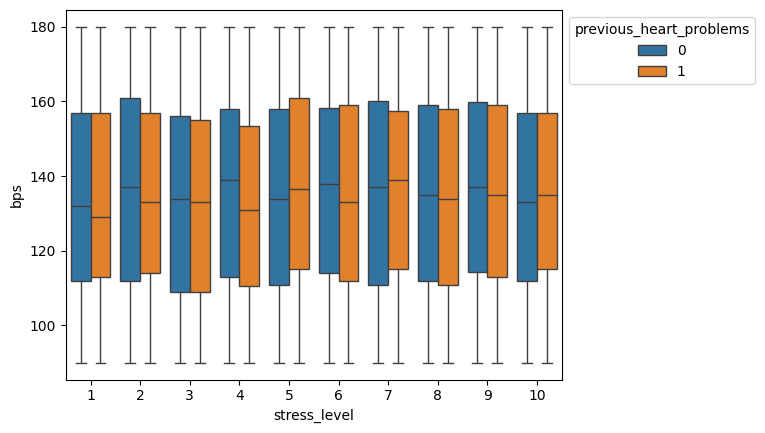

In [34]:
for f in frcv_cat[:-1]:
  ax=sns.boxplot(data=df_raw,y='bps',x='stress_level',hue=f)
  sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
  plt.show()

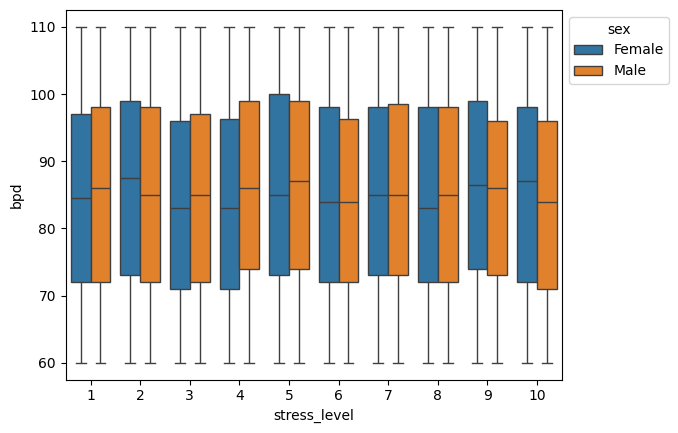

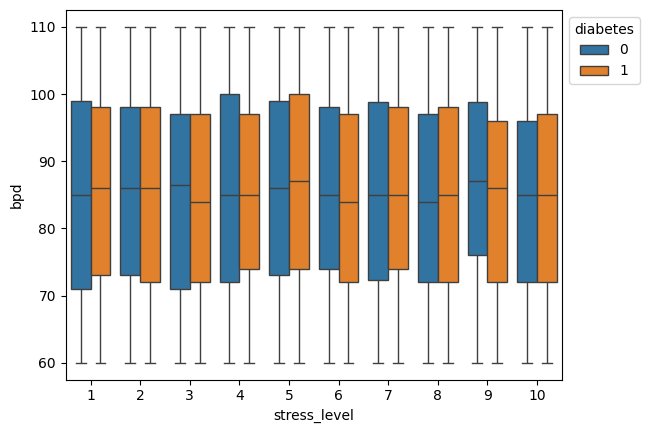

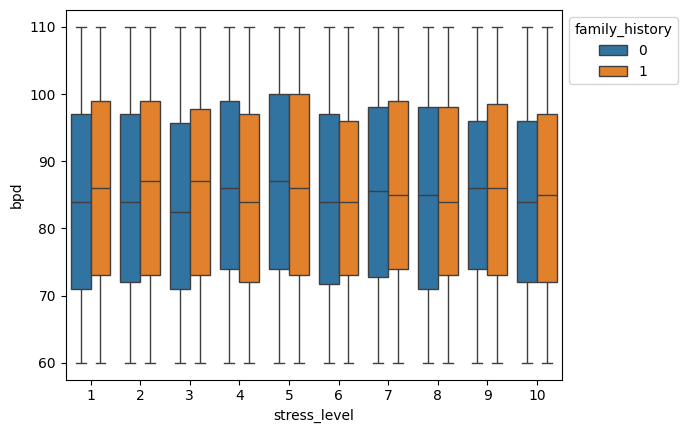

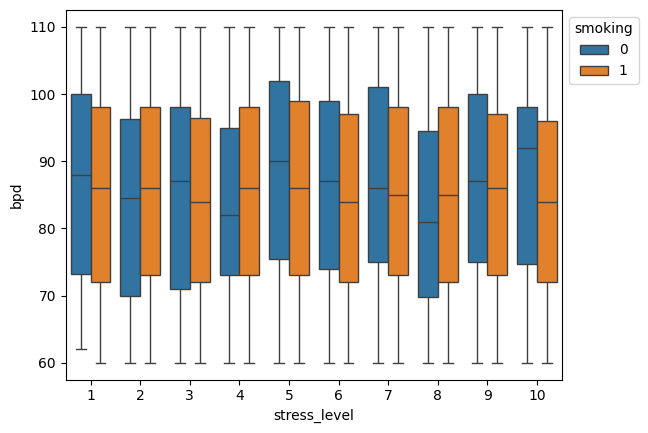

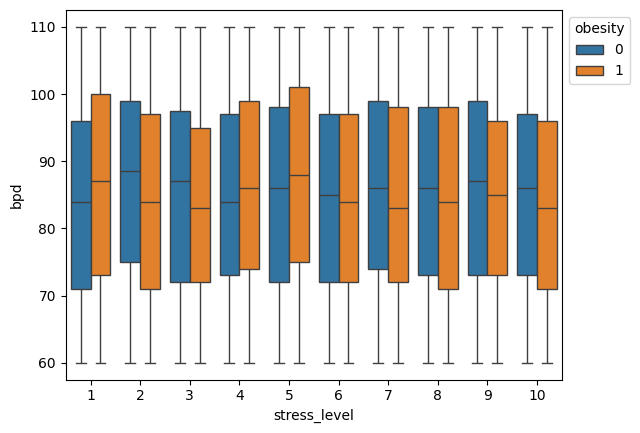

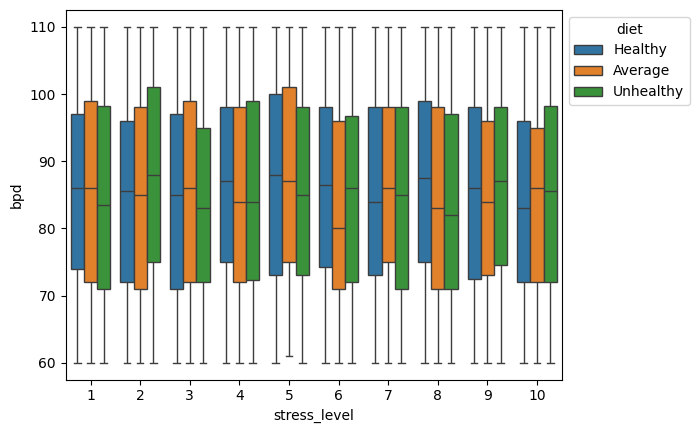

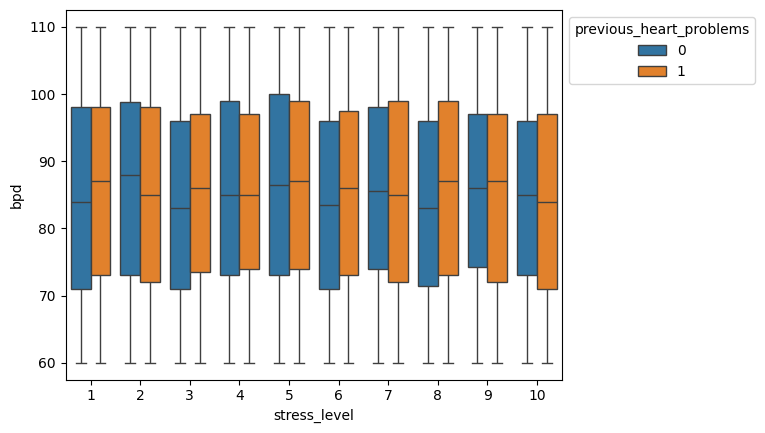

In [35]:
for f in frcv_cat[:-1]:
  ax=sns.boxplot(data=df_raw,y='bpd',x='stress_level',hue=f)
  sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
  plt.show()

Cuando segmentamos por los factores de riesgo categóricos no se observan grandes variaciones de las presiones sistólica o diastólica

In [36]:
# prompt: perform kruskall wallis test for df_raw['bps'] and df_raw['bpd'] across df_raw['stress_level'].

# Perform Kruskal-Wallis test for 'bps'
statistic, p_value = kruskal(*[group['bps'] for name, group in df_raw.groupby('stress_level',observed=False)])
print(f"Kruskal-Wallis test for bps across stress levels: statistic={statistic:.2f}, p-value={p_value:.3f}")

# Perform Kruskal-Wallis test for 'bpd'
statistic, p_value = kruskal(*[group['bpd'] for name, group in df_raw.groupby('stress_level',observed=False)])
print(f"Kruskal-Wallis test for bpd across stress levels: statistic={statistic:.2f}, p-value={p_value:.3f}")


Kruskal-Wallis test for bps across stress levels: statistic=10.63, p-value=0.302
Kruskal-Wallis test for bpd across stress levels: statistic=11.05, p-value=0.272


In [37]:
for frcv in frcv_cat[:-1]:
  for bp in ['bps','bpd']:
    statistic, p_value = kruskal(*[group[bp] for name, group in df_raw.groupby(frcv,observed=False)])
    print(f"Kruskal-Wallis test for {bp} across {frcv}: statistic={statistic:.2f}, p-value={p_value:.3f}")

Kruskal-Wallis test for bps across sex: statistic=0.31, p-value=0.579
Kruskal-Wallis test for bpd across sex: statistic=0.05, p-value=0.816
Kruskal-Wallis test for bps across diabetes: statistic=0.26, p-value=0.607
Kruskal-Wallis test for bpd across diabetes: statistic=0.00, p-value=0.959
Kruskal-Wallis test for bps across family_history: statistic=0.86, p-value=0.353
Kruskal-Wallis test for bpd across family_history: statistic=2.78, p-value=0.096
Kruskal-Wallis test for bps across smoking: statistic=0.79, p-value=0.375
Kruskal-Wallis test for bpd across smoking: statistic=1.35, p-value=0.246
Kruskal-Wallis test for bps across obesity: statistic=0.04, p-value=0.842
Kruskal-Wallis test for bpd across obesity: statistic=3.67, p-value=0.055
Kruskal-Wallis test for bps across diet: statistic=1.64, p-value=0.440
Kruskal-Wallis test for bpd across diet: statistic=0.84, p-value=0.658
Kruskal-Wallis test for bps across previous_heart_problems: statistic=1.23, p-value=0.267
Kruskal-Wallis test 

### Conclusión de la hipótesis 2: Las presiones sistólicas y diastólicas no se vieron influenciadas significativamente por los niveles de stress. Aún despues por ajustar por factores de riesgo cardiovasculares la distribución y valores medios de las presiones no demostraron diferencias significativas.

### Hipótesis 3: Relacionar país, región con  la dieta

In [38]:
#Recuerdo las listas con los FRCV y el target
target=df_raw.columns[-6:-3]
print(target)

Index(['country', 'continent', 'hemisphere'], dtype='object')


In [39]:
observaciones_por_continente=df_raw.groupby([target[2]],observed=False)[target[1]].value_counts()
observaciones_por_continente

hemisphere           continent    
Northern Hemisphere  Asia             2543
                     Europe           1380
                     North America     860
                     Africa            448
                     South America     429
                     Australia           0
Southern Hemisphere  South America     933
                     Australia         884
                     Europe            861
                     Africa            425
                     Asia                0
                     North America       0
Name: count, dtype: int64

Llama la atención el los casos de Hemisferio norte que estan dentro de Sur América. Pero estos son los casos de colombia. Que se encuentra al norte del Ecuador. Con lo cual no es un error.

In [40]:
import plotly.express as px

# Calculate the count of cases per country and store it in a new column
df_raw['case_count'] = df_raw['country'].map(df_raw['country'].value_counts())
plt.figure(figsize=(10,6))
# Create the choropleth map using the new 'case_count' column
fig = px.choropleth(df_raw,
                    locations='country',
                    locationmode='country names',
                    color='case_count', # Use the new column for color
                    hover_name='country',
                    title='Count of Cases per Country',
                    range_color=(300,df_raw['case_count'].max()),
                    color_continuous_scale='Greens',

)



fig.show()

<Figure size 1000x600 with 0 Axes>

In [41]:
lista=df_raw.groupby([target[1]],as_index=False,observed=False)[target[0]].value_counts()
lista[lista['count']!=0].reset_index(drop=True)


,continent,country,count
0,Africa,Nigeria,448
1,Africa,South Africa,425
2,Asia,China,436
3,Asia,Japan,433
4,Asia,Thailand,428
5,Asia,Vietnam,425
6,Asia,India,412
7,Asia,South Korea,409
8,Australia,Australia,449
9,Australia,New Zealand,435


In [42]:
# prompt: count the cases of each group of diet per country and create a choropleth that shows its number when hovering and paints the country according to the most frequent diet

# Calculate the most frequent diet for each country
n_dietas_pais=df_raw.groupby('country',observed=False)['diet'].value_counts().unstack()
n_dietas_pais['moda']=n_dietas_pais.max(axis=1)
n_dietas_pais['dieta_moda']=n_dietas_pais.idxmax(axis=1)


# Create the choropleth map
fig = px.choropleth(n_dietas_pais,
                    locations=n_dietas_pais.index.tolist(),
                    locationmode='country names',
                    color='dieta_moda', # Use the new column for color
                    hover_name=n_dietas_pais.index.tolist(),
                    hover_data=n_dietas_pais.columns[:3].tolist(),  # Show counts on hover
                    title='Most Frequent Diet per Country',
                    color_discrete_map={'Healthy': 'green', 'Average': 'yellow', 'Unhealthy': 'red'},
)
fig.update_layout(legend_title_text='Dieta más frecuente')

fig.show()


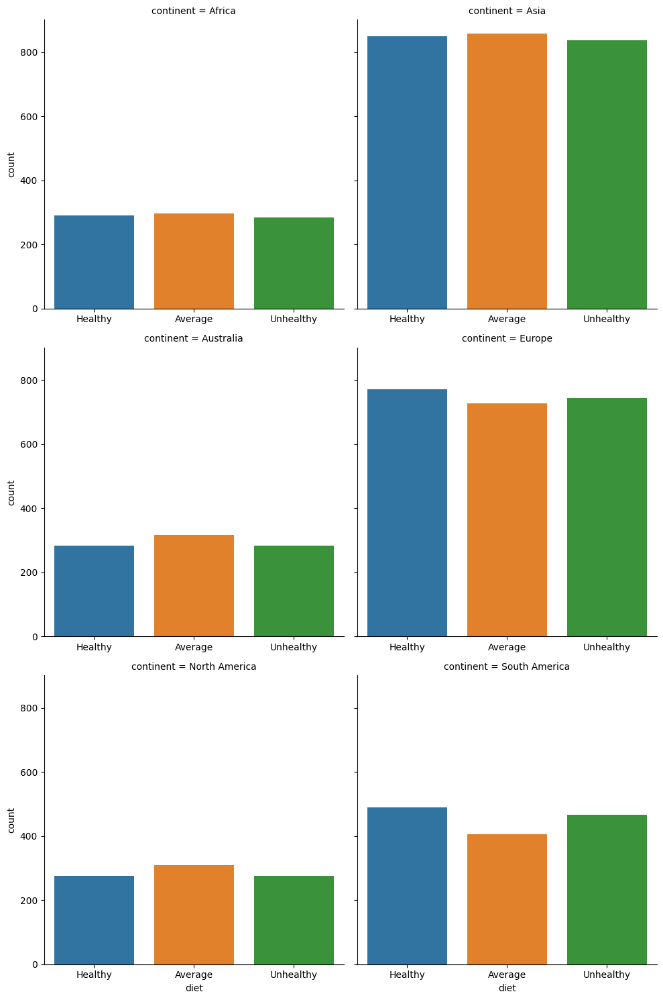

In [43]:
# Cantidad de observaciones por continente
sns.catplot(data=df_raw,x='diet',col=target[1],col_wrap=2,kind='count', hue='diet',sharex=False)

Asia, europa y america del sur tienen la mayor cantidad de observaciones, pero la distribuci'on en general por continente es similar

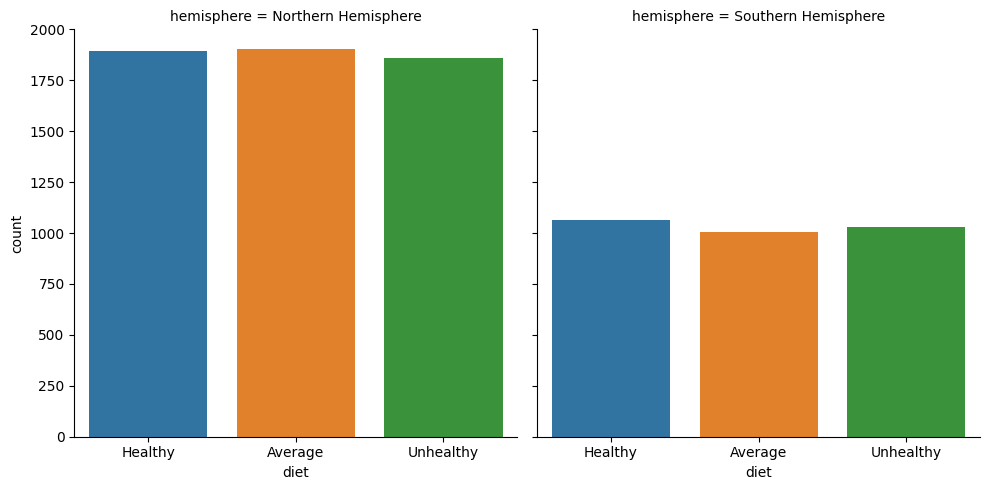

In [44]:
# observaciones por hemisferio
sns.catplot(data=df_raw,x='diet',col=target[2],kind='count', hue='diet')

hay mayor observacion de eventos en el hemisferio norte, las dietas siguen distribucion similar

In [45]:
# prompt: test chisquare for type of diet acroos hemisphere,continent and country. Flag significant differences

# Perform chi-square tests
features = ['hemisphere', 'continent', 'country']
for feature in features:
  contingency_table = pd.crosstab(df_raw[feature], df_raw['diet'])
  chi2, p, dof, expected = chi2_contingency(contingency_table)
  print(f"Chi-square test for diet across {feature}: p-value={p:.3f}")
  if p < 0.05:
    print(f"Significant difference in diet distribution across {feature}")


Chi-square test for diet across hemisphere: p-value=0.509
Chi-square test for diet across continent: p-value=0.142
Chi-square test for diet across country: p-value=0.188


### Conclusión de la Hipótesis 3: No se observa variación regional de la dieta en los distintos grupos geográficos analizados

# El objetivo del trabajo final es derivar y validar un modelo que prediga la probabilidad de padecer un evento coronario.

Desarrollo de un modelo de screening para excluir pacientes con alto riesgo de padecer un evento coronario

Variable target: heart_attack_risk

Esta tarea requiere un algoritmo de aprendizaje supervisado de tipo clasificación.

## Feaure Engineering
En la siguiente sección se realizará la matriz de correlación para determinar la correlación entre las variables. De esta manera veremos si podemos utilizar menos variables para nuestro modelo.
Del pair plot realizado en la sección anterior se desprende a simple vista que no hay un plano de separación claro por lo tanto métodos de clasificación que generen lineas, como regresión logística o SVM o métododos que de clasificación por cluster no tendrán buenos resultados.
Se pasará entonces a utilizar un modelo de arbol de decición y random forest. De manera exploratoria se utilizarán otras técnicas.

In [46]:
df_raw.head()

,patient_id,age,sex,cholesterol,heart_rate,diabetes,family_history,smoking,obesity,alcohol_consumption,exercise_hours_per_week,diet,previous_heart_problems,medication_use,stress_level,sedentary_hours_per_day,income,bmi,triglycerides,physical_activity_days_per_week,sleep_hours_per_day,country,continent,hemisphere,heart_attack_risk,bps,bpd,case_count
0,BMW7812,67,Male,208,72,0,0,1,0,0,4.17,Average,0,0,9,6.62,261404,31.25,286,0,6,Argentina,South America,Southern Hemisphere,0,158,88,471
1,CZE1114,21,Male,389,98,1,1,1,1,1,1.81,Unhealthy,1,0,1,4.96,285768,27.19,235,1,7,Canada,North America,Northern Hemisphere,0,165,93,440
2,BNI9906,21,Female,324,72,1,0,0,0,0,2.08,Healthy,1,1,9,9.46,235282,28.18,587,4,4,France,Europe,Northern Hemisphere,0,174,99,446
3,JLN3497,84,Male,383,73,1,1,1,0,1,9.83,Average,1,0,9,7.65,125640,36.46,378,3,4,Canada,North America,Northern Hemisphere,0,163,100,440
4,GFO8847,66,Male,318,93,1,1,1,1,0,5.80,Unhealthy,1,0,6,1.51,160555,21.81,231,1,5,Thailand,Asia,Northern Hemisphere,0,91,88,428


### Missing values
No es necesario reemplazar valores perdidos, ya que al ser una base de datos sintética, no es necesario.

### Encoding.
Las variables categóricas y el target serán cambiadas con label encoding. One hot encoding no se realizará para no aumentar el número de columnas.

In [47]:
#drop patient ID
df=df_raw.drop(columns='patient_id').copy()


In [48]:
#verifico las categorias de las variables para poder mapearlas luego a los labels
for i in df.columns:
  if df[i].dtype=='category':
    print(i)
    print(str(df[i].cat.categories.unique()) + str(df[i].cat.codes.unique()))
    print('\n')


sex
Index(['Female', 'Male'], dtype='object')[1 0]


diabetes
Index([0, 1], dtype='int64')[0 1]


family_history
Index([0, 1], dtype='int64')[0 1]


smoking
Index([0, 1], dtype='int64')[1 0]


obesity
Index([0, 1], dtype='int64')[0 1]


alcohol_consumption
Index([0, 1], dtype='int64')[0 1]


diet
Index(['Healthy', 'Average', 'Unhealthy'], dtype='object')[1 2 0]


previous_heart_problems
Index([0, 1], dtype='int64')[0 1]


medication_use
Index([0, 1], dtype='int64')[0 1]


stress_level
Index([1, 2, 3, 4, 5, 6, 7, 8, 9, 10], dtype='int64')[8 0 5 1 6 3 4 7 9 2]


physical_activity_days_per_week
Index([0, 1, 2, 3, 4, 5, 6, 7], dtype='int64')[0 1 4 3 5 6 7 2]


country
Index(['Argentina', 'Australia', 'Brazil', 'Canada', 'China', 'Colombia',
       'France', 'Germany', 'India', 'Italy', 'Japan', 'New Zealand',
       'Nigeria', 'South Africa', 'South Korea', 'Spain', 'Thailand',
       'United Kingdom', 'United States', 'Vietnam'],
      dtype='object')[ 0  3  6 16  7 10  2 13 18 19  4  9 1

In [49]:
#cambio las variables categoricas a label encoding
for i in df.columns:
  if df[i].dtype=='category':
    df[i]=df[i].cat.codes


En la matriz de correlación se utilizará el método de Spearman ya que la distribución de las variables no es normal

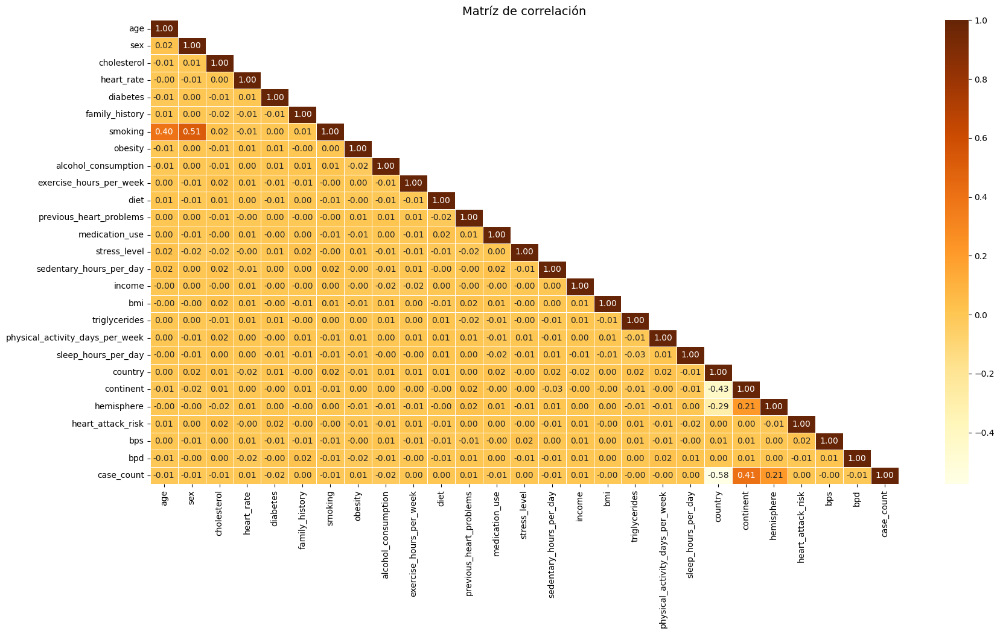

In [50]:
corr = df.corr(method = 'spearman',numeric_only=True,)
# mask para quitar la parte superior del cuadrado
mask = np.zeros_like(corr, dtype=bool)
mask[np.triu_indices_from(mask)] = True
np.fill_diagonal(mask, False)
#heatmap sns
fig, ax = plt.subplots(figsize=(20,10))
plt.title('Matríz de correlación', fontsize=14)
heatmap = sns.heatmap(corr,
                      annot=True,
                      annot_kws={"fontsize": 10},
                      fmt='.2f',
                      linewidths=0.5,
                      cmap='YlOrBr',
                      mask=mask,
                      ax=ax)

parece que hay una correlación moderada positiva entre fumar y la edad.

además hay una correlación moderada y leve entre país y continente y hemisferio. Como era de esperarse.
Recordemos la correlación estadísticamente significativa pero de leve intensidad entre colesterol y actividad física

## Primer análisis de modelos de clasificación

En la siguiente sección se evaluaran la performance generar sin hypertuning de los siguientes modelos:

* Arboles de decisión
* Random Forest
* XGBOOST
* regresión logística

Previo se a esto se utilizarán ténicas de under y over sampling debido a que es un Dataset desvalanceado.

Se realizará hypertuning de los dos mejores modelos


### Paquetes

In [51]:
#importo paquetes
from sklearn.model_selection import StratifiedKFold,cross_val_score, train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, confusion_matrix, ConfusionMatrixDisplay, f1_score, roc_curve, auc, RocCurveDisplay,roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import plot_tree
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV


In [52]:
pip install bayesian-optimization

In [53]:
pip install imbalanced-learn

In [54]:
from imblearn.combine import SMOTETomek


In [55]:
import xgboost as xgb
from xgboost import plot_importance,plot_tree

### Primer análisis de los modelos

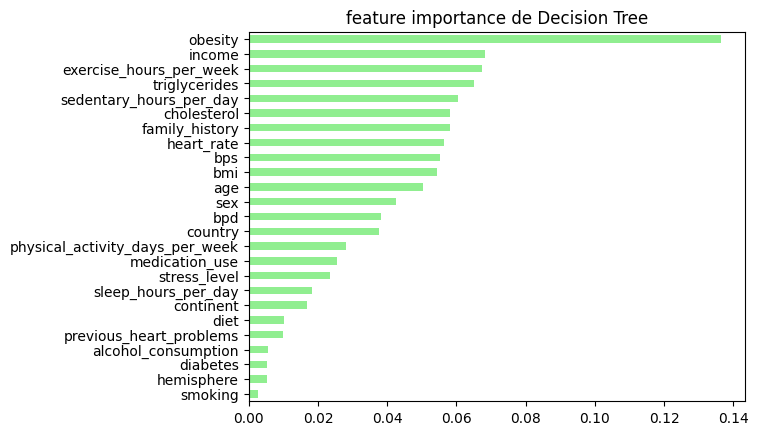

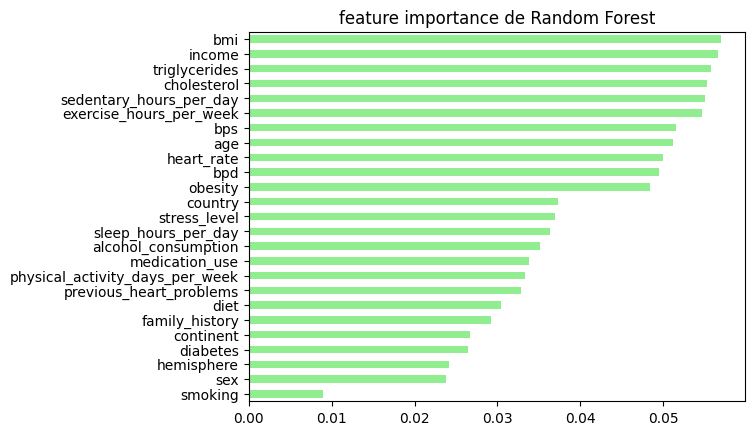

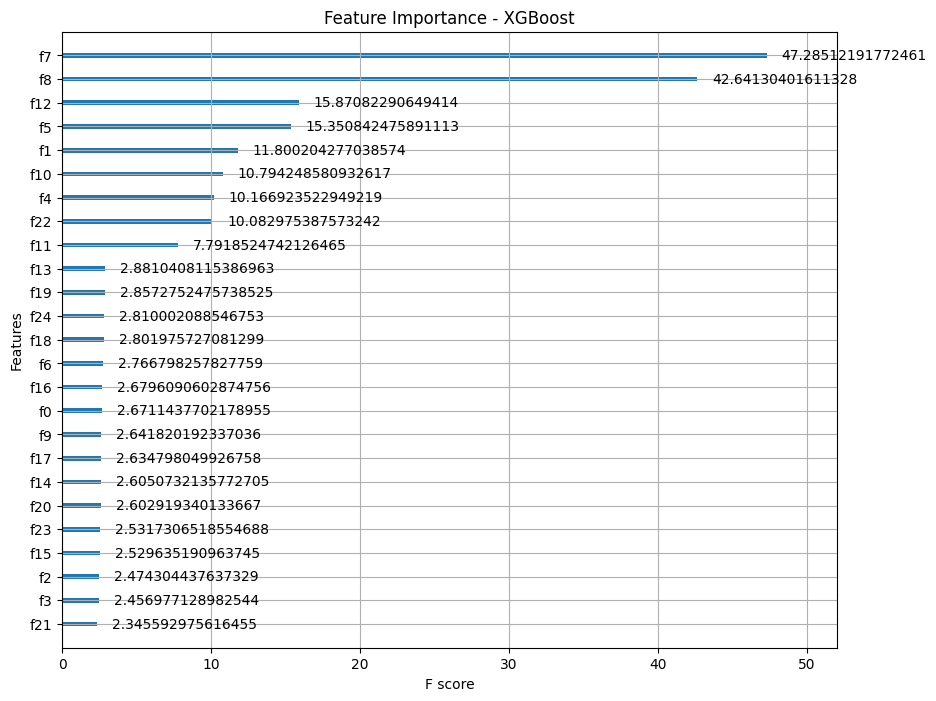

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



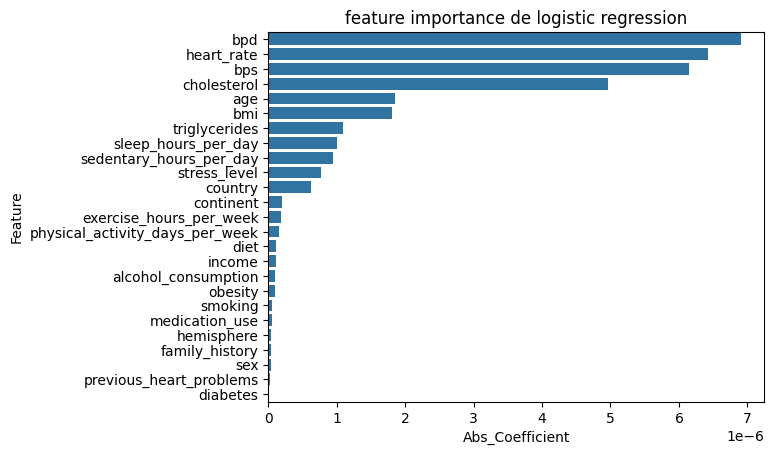

,score
Decision Tree train_sensibilidad,1.00
Decision Tree train_VPN,1.00
Decision Tree test_sensibilidad,0.74
Decision Tree test_VPN,0.63
Random Forest train_sensibilidad,1.00
Random Forest train_VPN,1.00
Random Forest test_sensibilidad,0.99
Random Forest test_VPN,0.75
XGBoost Clas train_sensibilidad,0.99
XGBoost Clas train_VPN,0.99


In [56]:
#target
y=df['heart_attack_risk'].values
#features
X=df.drop(columns=['heart_attack_risk','case_count']).values
feature_labels=df.columns[~df.columns.isin(['heart_attack_risk','case_count'])]
#modelos
tree=DecisionTreeClassifier(random_state=42)
rf=RandomForestClassifier(random_state=42)
xgboost=xgb.XGBClassifier(random_state=42)
lg=LogisticRegression(solver='saga'
                      ,penalty='elasticnet'
                      ,l1_ratio=0.5
                      ,random_state=42)
#diccionarios
score={}
model_name={tree:'Decision Tree'
              , rf:'Random Forest'
              ,xgboost:'XGBoost Clas'
              ,lg:'logistic regression'
              }
feature={}
#train test splite

x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42,stratify=y)



#smote
smote_tomek=SMOTETomek(random_state=42)
X_train_st, y_train_st = smote_tomek.fit_resample(x_train, y_train)

#Standardizing ya que voy a usar regresion logistica
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)  # fit on train, transform train
x_test = scaler.transform(x_test)

#looping

for i in [tree,rf,xgboost,lg]:
  i.fit(X_train_st, y_train_st)
  y_train_pred = i.predict(X_train_st)
  y_test_pred=i.predict(x_test)

  #train

  conf_matrix= confusion_matrix(y_train_st, y_train_pred)
  TN,FP,FN,TP=conf_matrix.ravel()
  score[model_name[i]+' train_sensibilidad']=round(TP/(TP+FN),2)
  score[model_name[i]+' train_VPN']=round(TN/(TN+FN),2)

  #test
  conf_matrix= confusion_matrix(y_test, y_test_pred)
  TN,FP,FN,TP=conf_matrix.ravel()
  score[model_name[i]+' test_sensibilidad']=round(TP/(TP+FN),2)
  score[model_name[i]+' test_VPN']=round(TN/(TN+FN),2)
  #feature importance
  if i==tree:
    importances_tree = pd.Series(i.feature_importances_, index=feature_labels)
    sorted_importances_tree = importances_tree.sort_values()
    feature[model_name[i]]=sorted_importances_tree
    sorted_importances_tree.plot(kind='barh', color='lightgreen')
    plt.title(f'feature importance de {model_name[i]}')
    plt.show()
  if i==rf:
    importances_rf = pd.Series(i.feature_importances_, index=feature_labels)
    # Ordenar importances_rf
    sorted_importances_rf = importances_rf.sort_values()
    feature[model_name[i]]=sorted_importances_rf
    sorted_importances_rf.plot(kind='barh', color='lightgreen')
    plt.title(f'feature importance de {model_name[i]}')
    plt.show()
  if i==xgboost:

    fig, ax = plt.subplots(figsize=(10, 8))
    xgb.plot_importance(xgboost, importance_type='gain', ax=ax, title='Feature Importance - XGBoost')

    feature_importances = xgboost.get_booster().get_score(importance_type='gain')
    feature[model_name[i]] = [{'label': label, 'score': feature_importances.get(f'f{index}', 0)}
                          for index, label in enumerate(feature_labels)]
    plt.show()
  if i==lg:
    feature_importance = pd.DataFrame({
    'Feature': feature_labels,
    'Coefficient': lg.coef_[0]
    })

    # Sort by absolute coefficient values to see which features are most important
    feature_importance['Abs_Coefficient'] = feature_importance['Coefficient'].abs()
    feature_importance = feature_importance.sort_values(by='Abs_Coefficient', ascending=False)
    feature[model_name[i]]=feature_importance
    sns.barplot(data=feature_importance, x='Abs_Coefficient', y='Feature')
    plt.title(f'feature importance de {model_name[i]}')
    plt.show()

pd.DataFrame(score,index=['score']).T

Los modelos que mejor performaron fueron por orden:
* Regresion logistica
* Decision tree
* XGBoost

Vamos a explorar los features más importantes para cada modelo antes de realizar la búsqueda de los mejores hyperparámetros.

Aunque parece haber un acuerdo en general de los más relevantes

## Regresión logística

In [57]:
feature['logistic regression'].sort_values(by='Abs_Coefficient',ascending=False).reset_index(drop=True)

,Feature,Coefficient,Abs_Coefficient
0,bpd,-0.00,0.00
1,heart_rate,-0.00,0.00
2,bps,-0.00,0.00
3,cholesterol,-0.00,0.00
4,age,-0.00,0.00
5,bmi,-0.00,0.00
6,triglycerides,0.00,0.00
7,sleep_hours_per_day,-0.00,0.00
8,sedentary_hours_per_day,-0.00,0.00
9,stress_level,-0.00,0.00


No hay un claro punto de corte donde los coeficiente caigan significativamente. Vamos a probar 'Smoking'. Ya que hasta este feature se capturan factores de riesgo cardiovacular establecidos, posterior a el hay cierta repeticion, ejemplo el 22 parece estar expresado por el 12, el 24 por el 4.
De esta manera reducimos la dimensionalidad y mejoramos los tiempos de computacion.

In [58]:
#capturo los features mas relevantes
columns=feature['logistic regression'].sort_values(by='Abs_Coefficient',ascending=False).reset_index(drop=True)['Feature'][:15]
columns=columns.to_list()
columns

['bpd',
 'heart_rate',
 'bps',
 'cholesterol',
 'age',
 'bmi',
 'triglycerides',
 'sleep_hours_per_day',
 'sedentary_hours_per_day',
 'stress_level',
 'country',
 'continent',
 'exercise_hours_per_week',
 'physical_activity_days_per_week',
 'diet']

In [59]:
#target
y=df['heart_attack_risk'].values
#features
X=df[columns]
feature_labels=columns

#train_val, test split
x_train_val,x_test,y_train_val,y_test=train_test_split(X,y,test_size=0.2,random_state=42,stratify=y)

#smote
smote_tomek=SMOTETomek(random_state=42)
X_train_val_st, y_train_val_st = smote_tomek.fit_resample(x_train_val, y_train_val)

#Standardizing ya que voy a usar regresion logistica
scaler = StandardScaler()
X_train_val_st = scaler.fit_transform(X_train_val_st)
x_test = scaler.transform(x_test)

skf=StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

lg=LogisticRegression(random_state=42)



In [60]:
param_grid={
    'solver':['saga'],
    'penalty':['elasticnet'],
    'C': np.logspace(-4, 4, 10),
    'l1_ratio': np.linspace(0, 1, 10),
    'class_weight': [None, 'balanced'],
    'max_iter': [100,200,300]
}



In [61]:
HVGS=HalvingGridSearchCV(lg,
                         param_grid,
                         min_resources=100,
                         factor=6,
                         cv=skf,
                         scoring='recall',
                         return_train_score=True,
                         random_state=42,
                         n_jobs=2,
                         verbose=1
)
HVGS.fit(X_train_val_st,y_train_val_st)

n_iterations: 3
n_required_iterations: 4
n_possible_iterations: 3
min_resources_: 100
max_resources_: 8434
aggressive_elimination: False
factor: 6
----------
iter: 0
n_candidates: 600
n_resources: 100
Fitting 5 folds for each of 600 candidates, totalling 3000 fits
----------
iter: 1
n_candidates: 100
n_resources: 600
Fitting 5 folds for each of 100 candidates, totalling 500 fits
----------
iter: 2
n_candidates: 17
n_resources: 3600
Fitting 5 folds for each of 17 candidates, totalling 85 fits


HalvingGridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                    estimator=LogisticRegression(random_state=42), factor=6,
                    min_resources=100, n_jobs=2,
                    param_grid={'C': array([1.00000000e-04, 7.74263683e-04, 5.99484250e-03, 4.64158883e-02,
       3.59381366e-01, 2.78255940e+00, 2.15443469e+01, 1.66810054e+02,
       1.29154967e+03, 1.00000000e+04]),
                                'class_weight': [None, 'balanced'],
                                'l1_ratio': array([0.        , 0.11111111, 0.22222222, 0.33333333, 0.44444444,
       0.55555556, 0.66666667, 0.77777778, 0.88888889, 1.        ]),
                                'max_iter': [100, 200, 300],
                                'penalty': ['elasticnet'], 'solver': ['saga']},
                    random_state=42, scoring='recall', verbose=1)

{'C': 0.0001, 'class_weight': 'balanced', 'l1_ratio': 0.4444444444444444, 'max_iter': 300, 'penalty': 'elasticnet', 'solver': 'saga'}
0.6


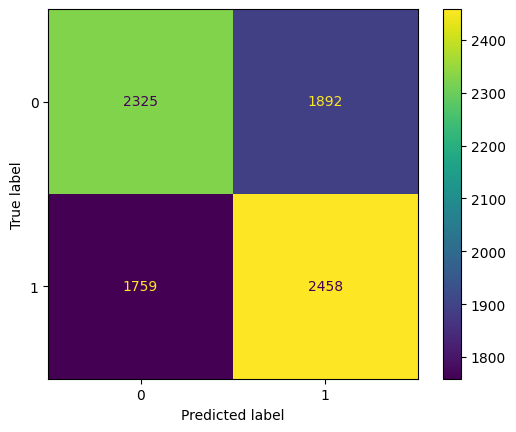

sensibilidad 0.5828788238083946
VPN 0.5692948090107738


In [62]:
print(HVGS.best_params_)
print(HVGS.best_score_)
#target
y=df['heart_attack_risk'].values
#features
X=df[columns]
feature_labels=columns

#train_val, test split
x_train_val,x_test,y_train_val,y_test=train_test_split(X,y,test_size=0.2,random_state=42,stratify=y)

# Resample first
smote_tomek = SMOTETomek(random_state=42)
X_train_val_st, y_train_val_st = smote_tomek.fit_resample(x_train_val, y_train_val)

# Standardize after resampling
scaler = StandardScaler()
X_train_val_st = scaler.fit_transform(X_train_val_st)
x_test = scaler.transform(x_test)

lg=LogisticRegression(C= 0.0055,class_weight=None,l1_ratio=0.44,
                      penalty='elasticnet',solver='saga',random_state=42)
lg.fit(X_train_val_st,y_train_val_st)
y_train_val_pred=lg.predict(X_train_val_st)
conf_matrix= confusion_matrix(y_train_val_st, y_train_val_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=lg.classes_)
disp.plot()
plt.show()
TN,FP,FN,TP=conf_matrix.ravel()
print(f'sensibilidad {TP/(TP+FN)}')
print(f'VPN {TN/(TN+FN)}')


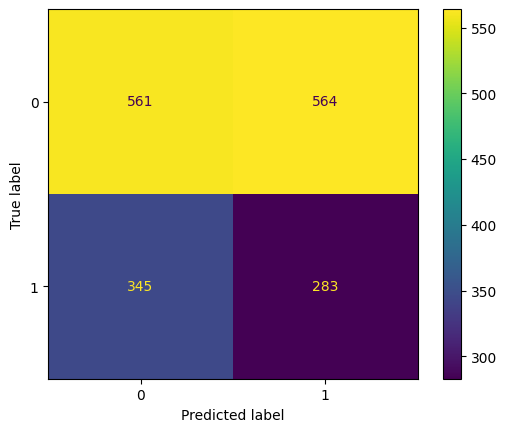

sensibilidad 0.45063694267515925
VPN 0.6192052980132451


In [63]:
y_pred=lg.predict(x_test)
conf_matrix= confusion_matrix(y_test, y_test_pred)
TN,FP,FN,TP=conf_matrix.ravel()
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=lg.classes_)
disp.plot()
plt.show()
print(f'sensibilidad {TP/(TP+FN)}')
print(f'VPN {TN/(TN+FN)}')



Los resultados no terminaron siendo satisfactorios. El modelo de regresión logistica no obtubo buenos resultados

## Tree Classifier
Vamos a tomar hasta el feature dieta.

In [64]:
columns=feature['Decision Tree'].sort_values(ascending=False).head(12).index.to_list()
columns

['obesity',
 'income',
 'exercise_hours_per_week',
 'triglycerides',
 'sedentary_hours_per_day',
 'cholesterol',
 'family_history',
 'heart_rate',
 'bps',
 'bmi',
 'age',
 'sex']

In [65]:
#target
y=df['heart_attack_risk'].values
#features
X=df[columns]
feature_labels=columns

#train_val, test split
x_train_val,x_test,y_train_val,y_test=train_test_split(X,y,test_size=0.2,random_state=42,stratify=y)

#smote
smote_tomek=SMOTETomek(random_state=42)
X_train_val_st, y_train_val_st = smote_tomek.fit_resample(x_train_val, y_train_val)

#Standardizing ya que voy a usar regresion logistica
scaler = StandardScaler()
X_train_val_st = scaler.fit_transform(X_train_val_st)
x_test = scaler.transform(x_test)



skf=StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

tree=tree=DecisionTreeClassifier(random_state=42)

In [66]:
param_grid = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 5],
    'class_weight': [None, 'balanced'],
    'max_features': [None, 'sqrt', 'log2']
}
HVGS=HalvingGridSearchCV(tree,
                         param_grid,
                         min_resources=100,
                         factor=6,
                         cv=skf,
                         scoring='recall',
                         return_train_score=True,
                         random_state=42,
                         n_jobs=2,
                         verbose=1
                         )
HVGS.fit(X_train_val_st,y_train_val_st)

n_iterations: 3
n_required_iterations: 4
n_possible_iterations: 3
min_resources_: 100
max_resources_: 7644
aggressive_elimination: False
factor: 6
----------
iter: 0
n_candidates: 216
n_resources: 100
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
----------
iter: 1
n_candidates: 36
n_resources: 600
Fitting 5 folds for each of 36 candidates, totalling 180 fits
----------
iter: 2
n_candidates: 6
n_resources: 3600
Fitting 5 folds for each of 6 candidates, totalling 30 fits


HalvingGridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=42, shuffle=True),
                    estimator=DecisionTreeClassifier(random_state=42), factor=6,
                    min_resources=100, n_jobs=2,
                    param_grid={'class_weight': [None, 'balanced'],
                                'max_depth': [None, 10, 20, 30],
                                'max_features': [None, 'sqrt', 'log2'],
                                'min_samples_leaf': [1, 2, 5],
                                'min_samples_split': [2, 5, 10]},
                    random_state=42, scoring='recall', verbose=1)

In [67]:
print(HVGS.best_params_)
print(HVGS.best_score_)


{'class_weight': 'balanced', 'max_depth': 10, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 10}
0.6209045461937686


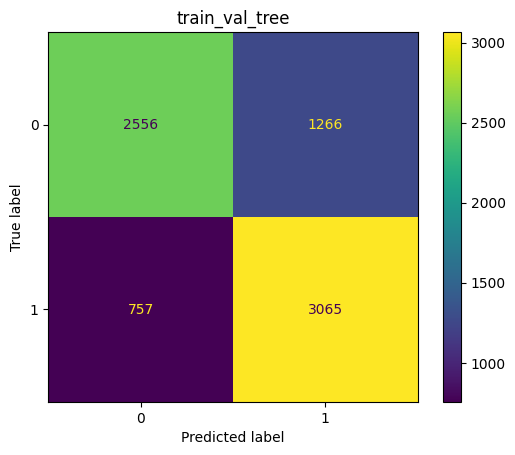

sensibilidad 0.8019361590790163
VPN 0.771506187745246


In [68]:
#modelo
tree=DecisionTreeClassifier(**HVGS.best_params_)
tree.fit(X_train_val_st,y_train_val_st)
#predict
y_train_val_pred=tree.predict(X_train_val_st)
#proba
y_train_val_prob=tree.predict_proba(X_train_val_st)[:, 1]
#matrix
conf_matrix= confusion_matrix(y_train_val_st, y_train_val_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=tree.classes_)
disp.plot()
plt.title('train_val_tree')
plt.show()
TN,FP,FN,TP=conf_matrix.ravel()
print(f'sensibilidad {TP/(TP+FN)}')
print(f'VPN {TN/(TN+FN)}')


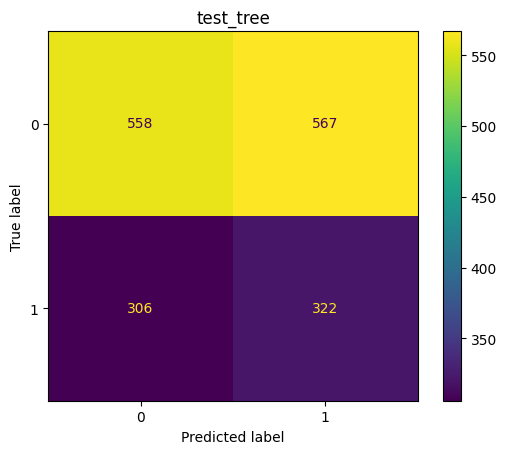

sensibilidad 0.5127388535031847
VPN 0.6458333333333334


In [69]:
y_pred=tree.predict(x_test)
conf_matrix= confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=tree.classes_)
disp.plot()
plt.title('test_tree')
plt.show()
TN,FP,FN,TP=conf_matrix.ravel()
print(f'sensibilidad {TP/(TP+FN)}')
print(f'VPN {TN/(TN+FN)}')


In [70]:
#continuar con predict proba
fpr, tpr, thresholds = roc_curve(y_train_val_st, y_train_val_prob)
J = tpr - fpr  # Youden's J statistic
best_threshold = thresholds[np.argmax(J)]
print(best_threshold)

0.5075921908893709


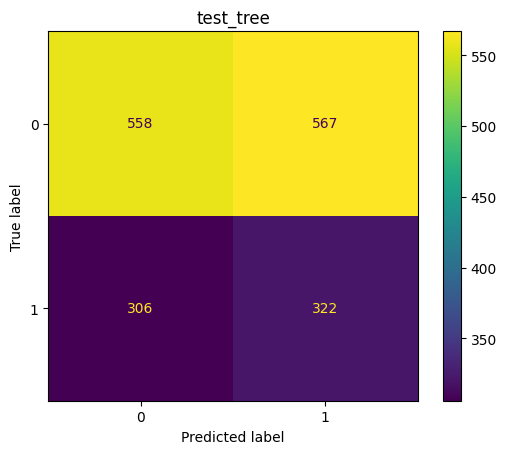

sensibilidad 0.5127388535031847
VPN 0.6458333333333334


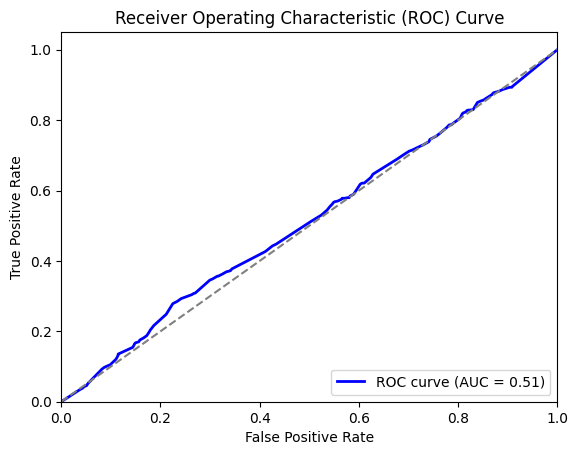

In [71]:
y_test_prob = tree.predict_proba(x_test)[:, 1]  # Predict on the test set
y_test_pred = (y_test_prob >= best_threshold).astype(int)
conf_matrix= confusion_matrix(y_test, y_test_pred )
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=tree.classes_)
disp.plot()
plt.title('test_tree')
plt.show()
TN,FP,FN,TP=conf_matrix.ravel()
print(f'sensibilidad {TP/(TP+FN)}')
print(f'VPN {TN/(TN+FN)}')
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)
roc_auc = roc_auc_score(y_test, y_test_prob)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Dashed diagonal line for reference
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

El modelo no cambia mucho usando el mejor punto de corte. Lo cual tiene sentido ya que el mejor punto de corte es cercano al 50%.
Este modelo es mejor que la regresi'on logistica pero no podemos usarlo de screening

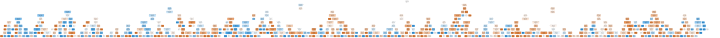

In [72]:
import graphviz
from sklearn.tree import export_graphviz
dot_data = export_graphviz(tree, out_file=None,
                                feature_names=feature_labels,
                                class_names=['0','1'],
                                filled=True, rounded=True,
                                special_characters=True

                                )
dot_data = 'digraph Tree {\nsize="10,10";\n' + dot_data[dot_data.find('node'):]
graph = graphviz.Source(dot_data)

graph

La visualización se observa muy compleja debido a la profundidad del arbol

## XGBoost Classifier

In [73]:
df_feature_importance=pd.DataFrame(feature['XGBoost Clas']).sort_values(by='score',ascending=False)
df_feature_importance

,label,score
7,obesity,47.29
8,alcohol_consumption,42.64
12,medication_use,15.87
5,family_history,15.35
1,sex,11.80
10,diet,10.79
4,diabetes,10.17
22,hemisphere,10.08
11,previous_heart_problems,7.79
13,stress_level,2.88


In [74]:
#vamos a utilizar los features hasta previous heart problems, debido a que luego hay una disminucion sustancial en el gain
columns=df_feature_importance['label'][:9].to_list()
columns

['obesity',
 'alcohol_consumption',
 'medication_use',
 'family_history',
 'sex',
 'diet',
 'diabetes',
 'hemisphere',
 'previous_heart_problems']

In [82]:
#target
y=df['heart_attack_risk'].values
#features
X=df[columns]
feature_labels=columns

#train_val, test split
x_train_val,x_test,y_train_val,y_test=train_test_split(X,y,test_size=0.2,random_state=42,stratify=y)

#smote
smote_tomek=SMOTETomek(random_state=42)
X_train_val_st, y_train_val_st = smote_tomek.fit_resample(x_train_val, y_train_val)

#Standardizing ya que voy a usar regresion logistica
scaler = StandardScaler()
X_train_val_st = scaler.fit_transform(X_train_val_st)
x_test = scaler.transform(x_test)



skf=StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

xgboost=xgb.XGBClassifier(random_state=42)

In [76]:
#esta celda esta comentada fuera porque tardó aproximadamente 1 hr en entrenar.
#Los mejores parámetros estan guardados en la celda siguiente, de esta manera al re correr la notebook, no se pierde tanto tiempo
'''param_grid = {
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [100, 200, 500],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3],
    'subsample': [0.7, 0.9],
    'colsample_bytree': [0.7, 0.9],
    'gamma': [0, 0.1],
    'scale_pos_weight': [1, 10, 25, 50],
    'reg_alpha': [0.01, 0.1],
    'reg_lambda': [0.1, 1.0],
}
HVGS=HalvingGridSearchCV(xgboost,
                         param_grid,
                         min_resources=100,
                         factor=6,
                         cv=skf,
                         scoring='recall',
                         return_train_score=True,
                         random_state=42,
                         n_jobs=2,
                         verbose=1
                         )
HVGS.fit(X_train_val_st,y_train_val_st)'''

"param_grid = {\n    'learning_rate': [0.01, 0.1, 0.2],\n    'n_estimators': [100, 200, 500],\n    'max_depth': [3, 5, 7],\n    'min_child_weight': [1, 3],\n    'subsample': [0.7, 0.9],\n    'colsample_bytree': [0.7, 0.9],\n    'gamma': [0, 0.1],\n    'scale_pos_weight': [1, 10, 25, 50],\n    'reg_alpha': [0.01, 0.1],\n    'reg_lambda': [0.1, 1.0],\n}\nHVGS=HalvingGridSearchCV(xgboost,\n                         param_grid,\n                         min_resources=100,\n                         factor=6,\n                         cv=skf,\n                         scoring='recall',\n                         return_train_score=True,\n                         random_state=42,\n                         n_jobs=2,\n                         verbose=1\n                         )\nHVGS.fit(X_train_val_st,y_train_val_st)"

In [77]:
best_params={'colsample_bytree': 0.9,
             'gamma': 0.1,
             'learning_rate': 0.1,
             'max_depth': 3,
             'min_child_weight': 3,
             'n_estimators': 100,
             'reg_alpha': 0.01,
             'reg_lambda': 1.0,
             'scale_pos_weight': 50,
             'subsample': 0.7}


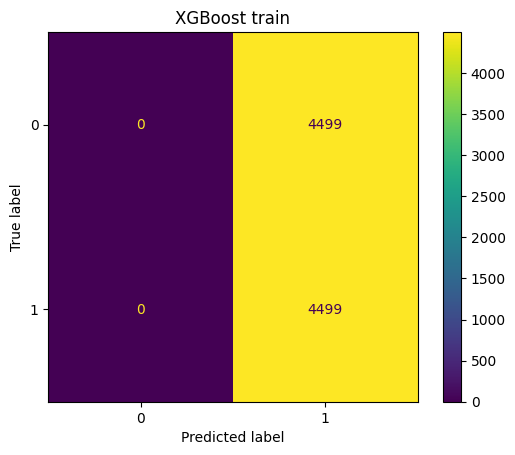

sensibilidad 1.0
VPN nan


<ipython-input-83-9836b24a21a8>:16: RuntimeWarning:

invalid value encountered in scalar divide



In [83]:
xgboost.set_params(**best_params)
# train
xgboost.fit(X_train_val_st,y_train_val_st)
#predict
y_train_val_pred=xgboost.predict(X_train_val_st)
#proba
y_train_val_prob=xgboost.predict_proba(X_train_val_st)[:, 1]
#matrix
conf_matrix= confusion_matrix(y_train_val_st, y_train_val_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=xgboost.classes_)
disp.plot()
plt.title('XGBoost train')
plt.show()
TN,FP,FN,TP=conf_matrix.ravel()
print(f'sensibilidad {TP/(TP+FN)}')
print(f'VPN {TN/(TN+FN)}')


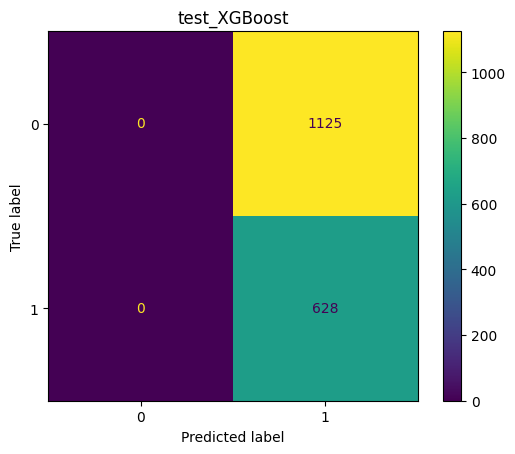

sensibilidad 1.0
VPN nan


<ipython-input-85-11caaf962dce>:9: RuntimeWarning:

invalid value encountered in scalar divide



In [85]:
# Test
y_pred=xgboost.predict(x_test)
conf_matrix= confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=xgboost.classes_)
disp.plot()
plt.title('test_XGBoost')
plt.show()
TN,FP,FN,TP=conf_matrix.ravel()
print(f'sensibilidad {TP/(TP+FN)}')
print(f'VPN {TN/(TN+FN)}')


0.98129547


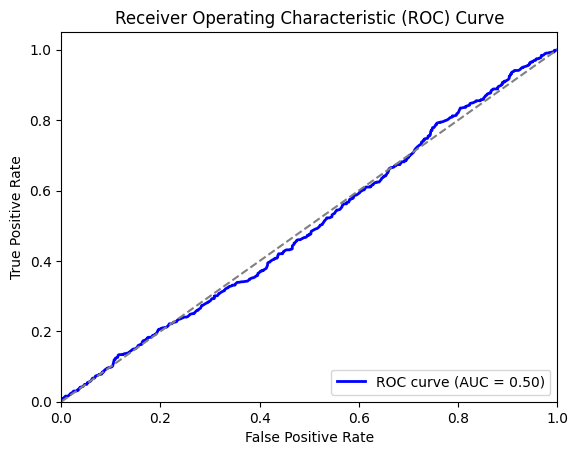

In [87]:
fpr, tpr, thresholds = roc_curve(y_train_val_st, y_train_val_prob)
J = tpr - fpr  # Youden's J statistic
best_threshold = thresholds[np.argmax(J)]
print(best_threshold)
y_test_prob = xgboost.predict_proba(x_test)[:, 1]  # Predict on the test set
y_test_pred = (y_test_prob >= best_threshold).astype(int)
fpr, tpr, thresholds = roc_curve(y_test, y_test_prob)
roc_auc = roc_auc_score(y_test, y_test_prob)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (AUC = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Dashed diagonal line for reference
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

El modelo tiene un gran overfit.
Vamos a regularizar algunos hyperparámetros de acuerdo a recomendaciones de ChatGPT

In [92]:
param_grid = {
    'max_depth': [2, 3],
    'min_child_weight': [3, 5, 7],
    'learning_rate': [0.01, 0.05],
    'n_estimators': [300, 500],
    'reg_alpha': [0.1, 1.0],
    'reg_lambda': [1.0, 5.0],
    'scale_pos_weight': [1, 10, 20]
}

grid_search = HalvingGridSearchCV(estimator=xgboost, param_grid=param_grid,
                           scoring='roc_auc', cv=5,
                            min_resources=100,
                            factor=6,
                            return_train_score=True,
                            random_state=42,
                            n_jobs=2,
                            verbose=1)
grid_search.fit(X_train_val_st, y_train_val_st)
print(f'Best Parameters: {grid_search.best_params_}')

n_iterations: 3
n_required_iterations: 4
n_possible_iterations: 3
min_resources_: 100
max_resources_: 8998
aggressive_elimination: False
factor: 6
----------
iter: 0
n_candidates: 288
n_resources: 100
Fitting 5 folds for each of 288 candidates, totalling 1440 fits
----------
iter: 1
n_candidates: 48
n_resources: 600
Fitting 5 folds for each of 48 candidates, totalling 240 fits
----------
iter: 2
n_candidates: 8
n_resources: 3600
Fitting 5 folds for each of 8 candidates, totalling 40 fits
Best Parameters: {'learning_rate': 0.05, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 500, 'reg_alpha': 0.1, 'reg_lambda': 1.0, 'scale_pos_weight': 20}


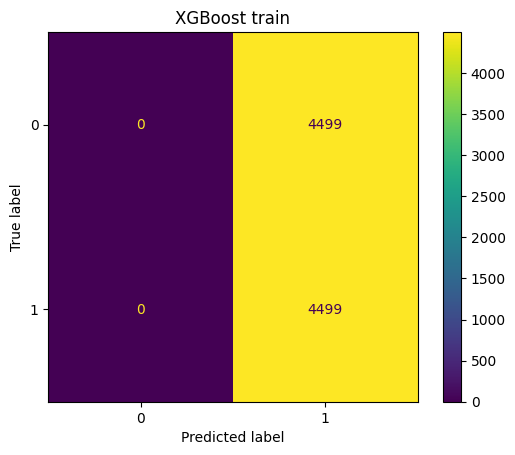

sensibilidad 1.0
VPN nan


<ipython-input-93-f0e606af770a>:24: RuntimeWarning:

invalid value encountered in scalar divide



In [93]:
best_params={'learning_rate': 0.05,
                 'max_depth': 3,
                 'min_child_weight': 3,
                 'n_estimators': 500,
                 'reg_alpha': 0.1,
                 'reg_lambda': 1.0,
                 'scale_pos_weight': 20
                 }
xgboost.set_params(**best_params)
# train
xgboost.fit(X_train_val_st,y_train_val_st)
#predict
y_train_val_pred=xgboost.predict(X_train_val_st)
#proba
y_train_val_prob=xgboost.predict_proba(X_train_val_st)[:, 1]
#matrix
conf_matrix= confusion_matrix(y_train_val_st, y_train_val_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=xgboost.classes_)
disp.plot()
plt.title('XGBoost train')
plt.show()
TN,FP,FN,TP=conf_matrix.ravel()
print(f'sensibilidad {TP/(TP+FN)}')
print(f'VPN {TN/(TN+FN)}')

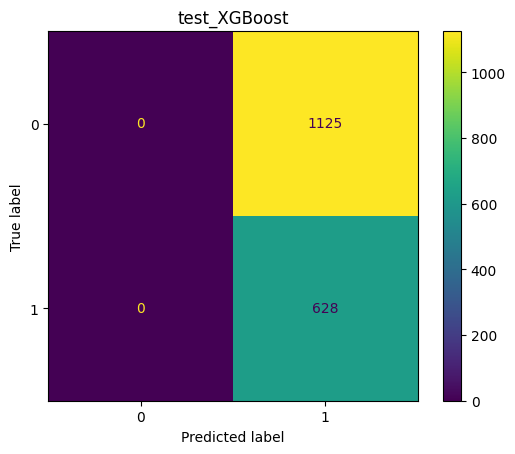

sensibilidad 1.0
VPN nan


<ipython-input-94-0ec6314b0bad>:10: RuntimeWarning:

invalid value encountered in scalar divide



In [94]:
# Test
y_pred=xgboost.predict(x_test)
conf_matrix= confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=xgboost.classes_)
disp.plot()
plt.title('test_XGBoost')
plt.show()
TN,FP,FN,TP=conf_matrix.ravel()
print(f'sensibilidad {TP/(TP+FN)}')
print(f'VPN {TN/(TN+FN)}')


# Conclusión

La elaboración de modelos de clasificación para la predicción de enfermedad cardiovascular en base a un Dataframe sintético arrojó unas métricas pobres para la clasificación tanto positiva como negativa. La imposibilidad de lograr un VPN acorde a un método de screening (al menos 90%) sugiere que la utilización de una base sintética para la derivación de una herramienta de screening no puede llevarse a la práctica. Se requerirán datos reales y más estudios para poder implementar estas tecnologías al área de la prevención secundaria de enfermedades cardiovasculares.